#Librerías

#Consideraciones
##Oro Blanco le falta info o días

In [ ]:
!pip install ta

In [ ]:
import pandas as pd
import ta
import numpy as np
!pip install mplfinance
import matplotlib.pyplot as plt


In [ ]:
import mplfinance as mpf

#Aguas Andina

##Cargar la información

In [ ]:
df_aguas_a = pd.read_csv('AGUAS_A.csv', index_col = 'Date')
df_aguas_a.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-05-12,358.55,359.9,359.42,359.90,3304727
2014-05-13,359.90,359.9,355.00,357.75,1879090
2014-05-14,357.75,359.0,357.00,358.12,5732055
2014-05-15,358.01,361.0,358.00,359.62,8080451
2014-05-16,359.62,360.0,358.00,358.38,2890630


In [ ]:
print(df_aguas_a)
df_aguas_a.shape[0]

              Open    High     Low   Close   Volume
Date                                               
2014-05-12  358.55  359.90  359.42  359.90  3304727
2014-05-13  359.90  359.90  355.00  357.75  1879090
2014-05-14  357.75  359.00  357.00  358.12  5732055
2014-05-15  358.01  361.00  358.00  359.62  8080451
2014-05-16  359.62  360.00  358.00  358.38  2890630
...            ...     ...     ...     ...      ...
2024-05-06  281.30  282.77  276.02  278.02  1497929
2024-05-07  278.02  281.00  277.64  279.00  4862335
2024-05-08  279.00  281.01  277.90  280.00  1632159
2024-05-09  280.00  282.00  279.85  282.00  8989689
2024-05-10  282.00  283.47  280.00  283.10  2702990

[2491 rows x 5 columns]


2491

##Cálculo de la media móvil simple para una ventana de 10 periodos para Aguas Andina

In [ ]:
df_aguas_a['aguas_a_sma_10'] = ta.trend.sma_indicator(df_aguas_a['Close'], window = 10)
df_aguas_a[['Close','aguas_a_sma_10']].head(10)

,Close,aguas_a_sma_10
Date,,
2014-05-12,359.90,NaN
2014-05-13,357.75,NaN
2014-05-14,358.12,NaN
2014-05-15,359.62,NaN
2014-05-16,358.38,NaN
2014-05-19,359.18,NaN
2014-05-20,342.12,NaN
2014-05-22,345.35,NaN
2014-05-23,344.99,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Aguas Andina

In [ ]:
df_aguas_a['aguas_a_stoch_k'] = ta.momentum.stoch(
    df_aguas_a['High'], df_aguas_a['Low'], df_aguas_a['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para aguas andina

In [ ]:
#df_aguas_a         #Son 2491 filas en total
df_aguas_a['msa_aguas_a'] = np.nan
i = 9
while i <= (df_aguas_a.shape[0]-1):
  if df_aguas_a['Close'].iloc[i] > df_aguas_a['aguas_a_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_aguas_a['msa_aguas_a'].iloc[i] = 1
  else:
    df_aguas_a['msa_aguas_a'].iloc[i] = 0
  i += 1



Streaming output truncated to the last 5000 lines.
<ipython-input-199-d4c15b39f044>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 0
<ipython-input-199-d4c15b39f044>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 0
<ipython-input-199-d4c15b39f044>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 0
<ipython-input-199-d4c15b39f

In [ ]:
df_aguas_a.tail(20)

,Open,High,Low,Close,Volume,aguas_a_sma_10,aguas_a_stoch_k,msa_aguas_a
Date,,,,,,,,
2024-04-12,282.00,283.48,278.50,281.99,1624153,280.537,62.732417,1.0
2024-04-15,280.00,280.78,275.01,278.00,3463336,279.987,25.798102,0.0
2024-04-16,278.00,278.73,272.00,276.99,6160229,279.336,34.178082,0.0
2024-04-17,276.99,276.00,273.00,273.54,2018624,278.292,10.547945,0.0
2024-04-18,273.50,275.00,270.50,273.53,2194508,277.715,18.819876,0.0
2024-04-19,273.53,273.87,265.02,265.02,4176063,276.367,0.000000,0.0
2024-04-22,265.02,273.50,266.02,273.50,1997257,276.207,44.678609,0.0
2024-04-23,273.50,272.89,266.92,268.31,4682370,275.338,17.425847,0.0
2024-04-24,268.31,269.96,266.10,266.10,2795564,273.898,5.850488,0.0


#Andina B

In [ ]:
df_andina = pd.read_csv('ANDINA_B.csv', index_col = 'Date')
df_andina.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-05-12,2250.0,2250.0,2210.0,2241.5,96172
2014-05-13,2241.5,2221.1,2150.0,2213.7,357976
2014-05-14,2213.7,2205.0,2180.0,2189.9,491542
2014-05-15,2189.9,2227.8,2176.0,2207.9,124985
2014-05-16,2207.9,2223.0,2209.0,2216.8,262793


#Cálculo de la media móvil simple para una ventana de 10 periodos para  Andina B

In [ ]:
df_andina['andina_b_sma_10'] = ta.trend.sma_indicator(df_andina['Close'], window = 10)
df_andina[['Close','andina_b_sma_10']].head(10)

,Close,andina_b_sma_10
Date,,
2014-05-12,2241.5,NaN
2014-05-13,2213.7,NaN
2014-05-14,2189.9,NaN
2014-05-15,2207.9,NaN
2014-05-16,2216.8,NaN
2014-05-19,2159.3,NaN
2014-05-20,2096.3,NaN
2014-05-22,2105.8,NaN
2014-05-23,2159.3,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Andina B

In [ ]:
df_andina['andina_b_stoch_k'] = ta.momentum.stoch(
    df_andina['High'], df_andina['Low'], df_andina['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Andina B

In [ ]:
# df_andina         #Son 2491 filas en total
df_andina['msa_andina_b'] = np.nan        #Inicializa la columna con valores nulos
i = 9
while i <= (df_andina.shape[0]-1):
  if df_andina['Close'].iloc[i] > df_andina['andina_b_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_andina['msa_andina_b'].iloc[i] = 1
  else:
    df_andina['msa_andina_b'].iloc[i] = 0
  i += 1


Streaming output truncated to the last 5000 lines.
<ipython-input-204-b30794fcb1ba>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-204-b30794fcb1ba>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-204-b30794fcb1ba>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-204-b30794fcb

In [ ]:
df_andina.tail(20)

,Open,High,Low,Close,Volume,andina_b_sma_10,andina_b_stoch_k,msa_andina_b
Date,,,,,,,,
2024-04-12,2650.0,2650.2,2560.0,2578.0,1593663,2549.69,58.606368,1.0
2024-04-15,2578.0,2604.0,2500.0,2553.0,1016598,2555.40,46.074283,0.0
2024-04-16,2553.0,2565.5,2521.1,2551.1,245819,2559.51,43.589744,0.0
2024-04-17,2551.1,2608.5,2551.0,2570.0,938613,2567.01,47.948855,1.0
2024-04-18,2570.0,2629.6,2551.0,2615.0,1069148,2577.99,71.923282,1.0
2024-04-19,2615.0,2625.0,2569.1,2615.0,426572,2588.31,71.923282,1.0
2024-04-22,2645.0,2645.0,2511.1,2600.0,654055,2595.58,62.944718,1.0
2024-04-23,2600.0,2615.0,2584.4,2609.0,610754,2598.50,67.870826,1.0
2024-04-24,2609.0,2616.8,2582.9,2596.0,1764429,2593.71,60.755337,1.0


#Datos BCI

In [ ]:
df_bci = pd.read_csv('BCI.csv', index_col = 'Date')
print(df_bci)

                 Open       High        Low      Close  Volume
Date                                                          
2014-05-05  20962.695  20962.695  20929.880  20930.537    9147
2014-05-06  20930.537  21100.521  20805.180  21100.521   92163
2014-05-07  21101.178  21658.390  21002.074  21622.293   75535
2014-05-08  21622.293  21914.354  21619.012  21763.400  108465
2014-05-09  21763.400  21750.930  20874.750  21699.082   71411
...               ...        ...        ...        ...     ...
2024-04-26  27385.000  27500.000  27110.000  27450.000   17829
2024-04-29  27450.000  28000.000  27500.000  28000.000  207407
2024-04-30  28000.000  28400.000  27600.000  28001.000   88232
2024-05-02  28001.000  28202.000  27626.000  27700.000  129335
2024-05-03  27700.000  28499.000  27859.000  28094.000   77007

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para BCI

In [ ]:
df_bci['bci_sma_10'] = ta.trend.sma_indicator(df_bci['Close'], window = 10)
df_bci[['Close','bci_sma_10']].head(10)

,Close,bci_sma_10
Date,,
2014-05-05,20930.537,NaN
2014-05-06,21100.521,NaN
2014-05-07,21622.293,NaN
2014-05-08,21763.400,NaN
2014-05-09,21699.082,NaN
2014-05-12,21771.275,NaN
2014-05-13,21943.230,NaN
2014-05-14,21980.640,NaN
2014-05-15,21961.607,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para BCI

In [ ]:
df_bci['bci_stoch_k'] = ta.momentum.stoch(
    df_bci['High'], df_bci['Low'], df_bci['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para BCI

In [ ]:
# df_bci         #Son 2491 filas en total
df_bci['msa_bci'] = np.nan
i = 9
while i <= (df_bci.shape[0]-1):
  if df_bci['Close'].iloc[i] > df_bci['bci_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bci['msa_bci'].iloc[i] = 1
  else:
    df_bci['msa_bci'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-209-872456e2591f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 1
<ipython-input-209-872456e2591f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 1
<ipython-input-209-872456e2591f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 0
<ipython-input-209-872456e2591f>:6: SettingWithCopyW

In [ ]:
df_bci.tail(20)

,Open,High,Low,Close,Volume,bci_sma_10,bci_stoch_k,msa_bci
Date,,,,,,,,
2024-04-05,27625.0,27626.0,27301.0,27450.0,43290,27788.5,41.340782,0.0
2024-04-08,27450.0,27900.0,27367.0,27900.0,53354,27849.0,65.694683,1.0
2024-04-09,27898.0,27950.0,27725.0,27725.0,93469,27908.5,55.663616,0.0
2024-04-10,27725.0,28499.0,27725.0,28201.0,168813,28012.1,82.359882,1.0
2024-04-11,28201.0,28350.0,28201.0,28350.0,59328,28047.1,90.980156,1.0
2024-04-12,28349.0,28349.0,27192.0,27850.0,174505,28031.1,57.208690,0.0
2024-04-15,27851.0,28200.0,27301.0,27420.0,100674,27943.1,21.167883,0.0
2024-04-16,27400.0,27553.0,26601.0,26812.0,108449,27774.3,11.111111,0.0
2024-04-17,26812.0,27360.0,26400.0,26609.0,152702,27594.2,9.952381,0.0


#Data Banco Santander

In [ ]:
df_bsantander = pd.read_csv('BSANTANDER.csv', index_col = 'Date')
print(df_bsantander)

             Open   High    Low  Close     Volume
Date                                             
2014-05-05  34.84  35.10  34.80  34.94   67008224
2014-05-06  34.94  35.08  34.65  34.90   65040056
2014-05-07  34.90  35.00  34.80  34.86   59217684
2014-05-08  34.90  35.00  34.74  34.90   81928384
2014-05-09  35.00  35.07  34.85  34.99   31693174
...           ...    ...    ...    ...        ...
2024-04-26  43.45  43.70  43.28  43.48   91399176
2024-04-29  43.48  43.80  43.32  43.70  205530832
2024-04-30  43.70  44.18  43.21  43.50  198277360
2024-05-02  43.50  44.00  42.62  42.82  167727040
2024-05-03  43.10  43.50  42.63  42.67  125669968

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Banco Santander

In [ ]:
df_bsantander['b_santander_sma_10'] = ta.trend.sma_indicator(df_bsantander['Close'], window = 10)
df_bsantander[['Close','b_santander_sma_10']].head(10)

,Close,b_santander_sma_10
Date,,
2014-05-05,34.94,NaN
2014-05-06,34.90,NaN
2014-05-07,34.86,NaN
2014-05-08,34.90,NaN
2014-05-09,34.99,NaN
2014-05-12,34.69,NaN
2014-05-13,34.69,NaN
2014-05-14,34.93,NaN
2014-05-15,34.71,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Banco Santander

In [ ]:
df_bsantander['b_santander_stoch_k'] = ta.momentum.stoch(
    df_bsantander['High'], df_bsantander['Low'], df_bsantander['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Banco Santander

In [ ]:
#df_bsantander         #Son 2491 filas en total
df_bsantander['msa_bsantander'] = np.nan
i = 9
while i <= (df_bsantander.shape[0]-1):
  if df_bsantander['Close'].iloc[i] > df_bsantander['b_santander_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bsantander['msa_bsantander'].iloc[i] = 1
  else:
    df_bsantander['msa_bsantander'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-214-79a08a4a8e35>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 1
<ipython-input-214-79a08a4a8e35>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 1
<ipython-input-214-79a08a4a8e35>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 1
<ipython-i

In [ ]:
df_bsantander.tail(20)

,Open,High,Low,Close,Volume,b_santander_sma_10,b_santander_stoch_k,msa_bsantander
Date,,,,,,,,
2024-04-05,48.30,49.30,47.65,47.65,59852520,48.482,25.000000,0.0
2024-04-08,47.65,48.70,47.60,47.89,93044784,48.513,33.000000,0.0
2024-04-09,47.89,48.27,47.55,47.75,140366064,48.508,28.333333,0.0
2024-04-10,47.75,47.94,47.22,47.22,165215376,48.391,9.459459,0.0
2024-04-11,47.02,47.55,47.00,47.20,94563432,48.276,8.783784,0.0
2024-04-12,47.20,47.59,46.00,46.28,137081696,48.024,7.179487,0.0
2024-04-15,46.33,46.55,45.85,46.08,132448952,47.732,5.679012,0.0
2024-04-16,46.08,47.03,45.06,45.79,202465600,47.346,15.082645,0.0
2024-04-17,45.80,46.10,45.00,45.85,146006480,47.001,17.346939,0.0


#Data CAP

In [ ]:
df_cap = pd.read_csv('CAP.csv', index_col = 'Date')
print(df_cap)

              Open    High     Low   Close  Volume
Date                                              
2014-05-05  8519.3  8500.0  8300.0  8372.9  111534
2014-05-06  8372.9  8460.0  8360.0  8459.5   75823
2014-05-07  8459.5  8500.0  8441.7  8481.4   86485
2014-05-08  8481.4  8700.0  8410.0  8649.0  198117
2014-05-09  8649.0  8706.0  8499.0  8551.3   65824
...            ...     ...     ...     ...     ...
2024-04-26  6909.9  6938.0  6810.0  6868.8  130220
2024-04-29  6875.0  6995.0  6790.0  6995.0  247093
2024-04-30  6995.0  6988.8  6850.0  6864.5  104913
2024-05-02  6860.0  6928.0  6860.0  6900.0  112550
2024-05-03  6900.1  6925.0  6800.0  6886.0   98613

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CAP

In [ ]:
df_cap['cap_sma_10'] = ta.trend.sma_indicator(df_cap['Close'], window = 10)
df_cap[['Close','cap_sma_10']].head(10)

,Close,cap_sma_10
Date,,
2014-05-05,8372.9,NaN
2014-05-06,8459.5,NaN
2014-05-07,8481.4,NaN
2014-05-08,8649.0,NaN
2014-05-09,8551.3,NaN
2014-05-12,8888.3,NaN
2014-05-13,8889.7,NaN
2014-05-14,8895.4,NaN
2014-05-15,8858.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CAP

In [ ]:
df_cap['cap_stoch_k'] = ta.momentum.stoch(
    df_cap['High'], df_cap['Low'], df_cap['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CAP

In [ ]:
#df_cap         #Son 2491 filas en total
df_cap['msa_cap'] = np.nan
i = 9
while i <= (df_cap.shape[0]-1):
  if df_cap['Close'].iloc[i] > df_cap['cap_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cap['msa_cap'].iloc[i] = 1
  else:
    df_cap['msa_cap'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-219-5b1f1a6d2db0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 1
<ipython-input-219-5b1f1a6d2db0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 1
<ipython-input-219-5b1f1a6d2db0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 1
<ipython-input-219-5b1f1a6d2db0>:6: SettingWithCopyW

In [ ]:
df_cap.tail(20)

,Open,High,Low,Close,Volume,cap_sma_10,cap_stoch_k,msa_cap
Date,,,,,,,,
2024-04-05,6910.0,6920.0,6840.9,6897.2,128824,6891.83,46.327925,1.0
2024-04-08,7000.0,7080.0,7000.0,7038.0,228442,6911.68,60.123375,1.0
2024-04-09,7100.0,7155.1,7075.0,7109.0,360216,6926.78,67.944481,1.0
2024-04-10,7109.0,7139.6,7000.0,7129.0,228009,6951.68,60.147059,1.0
2024-04-11,7129.0,7200.0,7064.0,7150.0,187797,6991.68,89.583333,1.0
2024-04-12,7180.0,7280.0,7010.0,7088.6,371612,7027.68,65.821429,1.0
2024-04-15,7101.0,7220.0,7018.3,7041.0,236724,7042.08,57.321429,0.0
2024-04-16,7041.0,7050.1,6950.0,7020.0,248185,7046.28,53.571429,0.0
2024-04-17,7113.0,7170.0,7015.0,7050.0,301493,7043.28,58.558559,1.0


#Data CCU

In [ ]:
df_ccu = pd.read_csv('CCU.csv', index_col = 'Date')
print(df_ccu)

              Open    High     Low   Close  Volume
Date                                              
2014-05-05  6610.2  6560.0  6460.0  6509.0  141678
2014-05-06  6509.0  6549.0  6450.0  6462.7   61136
2014-05-07  6462.7  6549.0  6387.9  6395.1  115156
2014-05-08  6395.1  6540.0  6395.0  6499.1  316113
2014-05-09  6499.1  6500.0  6400.0  6418.9   52188
...            ...     ...     ...     ...     ...
2024-04-26  5759.0  5840.0  5758.9  5840.0  434075
2024-04-29  5800.0  5930.0  5800.0  5930.0  155931
2024-04-30  5930.0  5919.3  5801.0  5890.0  354034
2024-05-02  5890.0  5996.5  5845.9  5851.0  385503
2024-05-03  5875.0  6043.3  5875.0  5999.9  533295

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CCU

In [ ]:
df_ccu['ccu_sma_10'] = ta.trend.sma_indicator(df_ccu['Close'], window = 10)
df_ccu[['Close','ccu_sma_10']].head(10)

,Close,ccu_sma_10
Date,,
2014-05-05,6509.0,NaN
2014-05-06,6462.7,NaN
2014-05-07,6395.1,NaN
2014-05-08,6499.1,NaN
2014-05-09,6418.9,NaN
2014-05-12,6424.6,NaN
2014-05-13,6443.3,NaN
2014-05-14,6499.8,NaN
2014-05-15,6499.2,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CCU

In [ ]:
df_ccu['ccu_stoch_k'] = ta.momentum.stoch(
    df_ccu['High'], df_ccu['Low'], df_ccu['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CCU

In [ ]:
#df_ccu         #Son 2491 filas en total
df_ccu['msa_ccu'] = np.nan
i = 9
while i <= (df_ccu.shape[0]-1):
  if df_ccu['Close'].iloc[i] > df_ccu['ccu_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ccu['msa_ccu'].iloc[i] = 1
  else:
    df_ccu['msa_ccu'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-224-537e445915cb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-224-537e445915cb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-224-537e445915cb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-224-537e445915cb>:8: SettingWithCopyW

In [ ]:
df_ccu.tail(20)

,Open,High,Low,Close,Volume,ccu_sma_10,ccu_stoch_k,msa_ccu
Date,,,,,,,,
2024-04-05,5830.5,5848.0,5781.1,5790.0,640358,5802.66,57.929293,0.0
2024-04-08,5790.0,5800.5,5780.0,5790.1,219331,5803.17,54.609929,0.0
2024-04-09,5790.1,5839.0,5760.0,5810.7,331373,5805.74,57.152635,1.0
2024-04-10,5810.7,5879.9,5766.1,5870.0,465315,5812.84,93.516699,1.0
2024-04-11,5860.0,6130.0,5850.0,6130.0,744221,5846.74,100.000000,1.0
2024-04-12,6130.0,6130.0,5930.0,5995.1,474813,5864.55,66.509434,1.0
2024-04-15,5995.1,6084.0,5860.0,5864.0,324314,5866.44,28.127533,0.0
2024-04-16,5864.0,5864.0,5762.7,5810.0,226994,5868.64,13.513514,0.0
2024-04-17,5810.0,5813.7,5705.0,5753.0,495117,5864.34,11.294118,0.0


#Data Cencosud

In [ ]:
df_cencosud = pd.read_csv('CENCOSUD.csv', index_col = 'Date')
print(df_cencosud)                                                #Esta comienza el día 07-04-2014 a diferencia de las otras que comienza después

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  1926.3  1926.0  1910.0  1918.2  1382001
2014-05-06  1918.2  1910.0  1883.2  1896.4  1220996
2014-05-07  1896.4  1900.0  1890.0  1897.2   683790
2014-05-08  1897.2  1910.7  1891.8  1906.9  1334214
2014-05-09  1906.9  1900.0  1885.6  1897.2   870173
...            ...     ...     ...     ...      ...
2024-04-26  1595.0  1618.0  1595.0  1618.0  5595442
2024-04-29  1618.0  1670.1  1617.0  1670.0  7234760
2024-04-30  1670.0  1670.4  1637.7  1645.1  4239095
2024-05-02  1645.1  1659.0  1625.4  1655.0  2300540
2024-05-03  1659.0  1696.6  1646.9  1695.3  4442285

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Cencosud

In [ ]:
df_cencosud['cencosud_sma_10'] = ta.trend.sma_indicator(df_cencosud['Close'], window = 10)
df_cencosud[['Close','cencosud_sma_10']].head(10)

,Close,cencosud_sma_10
Date,,
2014-05-05,1918.2,NaN
2014-05-06,1896.4,NaN
2014-05-07,1897.2,NaN
2014-05-08,1906.9,NaN
2014-05-09,1897.2,NaN
2014-05-12,1904.9,NaN
2014-05-13,1947.9,NaN
2014-05-14,1951.8,NaN
2014-05-15,1968.5,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Cencosud

In [ ]:
df_cencosud['cencosud_stoch_k'] = ta.momentum.stoch(
    df_cencosud['High'], df_cencosud['Low'], df_cencosud['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para cencosud

In [ ]:
#df_cencosud         #Son 2491 filas en total
df_cencosud['msa_cencosud'] = np.nan
i = 9
while i <= (df_cencosud.shape[0]-1):
  if df_cencosud['Close'].iloc[i] > df_cencosud['cencosud_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cencosud['msa_cencosud'].iloc[i] = 1
  else:
    df_cencosud['msa_cencosud'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-229-4d5398090e19>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 1
<ipython-input-229-4d5398090e19>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 1
<ipython-input-229-4d5398090e19>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 0
<ipython-input-229-4d5

In [ ]:
df_cencosud.tail(20)

,Open,High,Low,Close,Volume,cencosud_sma_10,cencosud_stoch_k,msa_cencosud
Date,,,,,,,,
2024-04-05,1676.0,1688.7,1645.0,1645.0,2376042,1685.00,0.000000,0.0
2024-04-08,1645.0,1669.9,1630.1,1651.0,4134876,1681.20,21.239837,0.0
2024-04-09,1651.7,1672.8,1638.0,1657.0,5379254,1679.70,27.337398,0.0
2024-04-10,1657.0,1680.0,1654.4,1665.0,5545645,1679.40,35.467480,0.0
2024-04-11,1665.0,1699.0,1664.9,1699.0,4832096,1680.80,70.020325,1.0
2024-04-12,1698.9,1700.0,1643.7,1659.0,3014337,1676.70,29.369919,0.0
2024-04-15,1660.0,1674.8,1615.1,1615.1,4158828,1666.71,0.000000,0.0
2024-04-16,1615.1,1623.0,1581.5,1605.0,4368668,1656.21,15.986395,0.0
2024-04-17,1605.0,1647.0,1612.9,1647.0,4312048,1651.91,44.557823,0.0


#Data Banco Chile

In [ ]:
df_bchile = pd.read_csv('CHILE.csv', index_col = 'Date')
print(df_bchile)

                  Open      High       Low     Close    Volume
Date                                                          
2014-05-05   63.870804   64.3501   63.6094   64.1235  27653746
2014-05-06   64.123620   64.1758   63.5223   64.0452  21233324
2014-05-07   64.045135   64.0625   63.8882   63.9580  24848166
2014-05-08   63.957930   64.6551   63.7226   64.5766  51839596
2014-05-09   64.576650   64.8903   64.4111   64.8642  38656344
...                ...       ...       ...       ...       ...
2024-04-26  104.500000  106.0000  104.8700  105.7800  27783672
2024-04-29  105.780000  106.7900  105.3000  105.8700  78024936
2024-04-30  105.870000  107.1500  105.0300  106.5000  55769088
2024-05-02  106.450000  107.0000  104.6000  105.9900  75409744
2024-05-03  106.180000  106.4000  105.0100  105.3800  26431576

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Banco Chile

In [ ]:
df_bchile['bchile_sma_10'] = ta.trend.sma_indicator(df_bchile['Close'], window = 10)
df_bchile[['Close','bchile_sma_10']].head(10)

,Close,bchile_sma_10
Date,,
2014-05-05,64.1235,NaN
2014-05-06,64.0452,NaN
2014-05-07,63.9580,NaN
2014-05-08,64.5766,NaN
2014-05-09,64.8642,NaN
2014-05-12,64.9253,NaN
2014-05-13,65.5352,NaN
2014-05-14,65.6222,NaN
2014-05-15,65.3260,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Banco Chile

In [ ]:
df_bchile['bchile_stoch_k'] = ta.momentum.stoch(
    df_bchile['High'], df_bchile['Low'], df_bchile['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Banco Chile

In [ ]:
#df_bchile         #Son 2491 filas en total
df_bchile['msa_bchile'] = np.nan
i = 9
while i <= (df_bchile.shape[0]-1):
  if df_bchile['Close'].iloc[i] > df_bchile['bchile_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bchile['msa_bchile'].iloc[i] = 1
  else:
    df_bchile['msa_bchile'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-234-46e71b618f30>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 1
<ipython-input-234-46e71b618f30>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 1
<ipython-input-234-46e71b618f30>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 1
<ipython-input-234-46e71b618f30>:6

In [ ]:
df_bchile.tail(20)

,Open,High,Low,Close,Volume,bchile_sma_10,bchile_stoch_k,msa_bchile
Date,,,,,,,,
2024-04-05,108.30,109.93,108.01,109.93,117999104,108.645,73.966165,1.0
2024-04-08,109.95,109.95,108.50,108.69,140166640,108.244,62.312030,1.0
2024-04-09,108.69,109.95,108.11,108.38,94433592,108.436,59.398496,0.0
2024-04-10,108.49,109.42,107.97,109.00,25657268,108.602,65.225564,1.0
2024-04-11,108.99,109.14,108.52,109.00,43923344,108.772,65.225564,1.0
2024-04-12,109.00,109.00,107.00,107.30,70859096,108.602,65.994962,0.0
2024-04-15,107.50,109.00,105.93,106.00,51145824,108.321,1.719902,0.0
2024-04-16,106.01,108.00,104.88,106.49,284295488,108.180,31.445312,0.0
2024-04-17,106.49,111.00,104.57,107.20,57746776,108.099,40.902022,0.0


#Data CMPC

In [ ]:
df_cmpc = pd.read_csv('CMPC.csv', index_col = 'Date')
print(df_cmpc)

                 Open       High        Low      Close   Volume
Date                                                           
2014-05-05  1248.6881  1260.9390  1245.5009  1249.9829   246103
2014-05-06  1249.9829  1249.9829  1230.0629  1245.7001   822517
2014-05-07  1245.7001  1264.9230  1244.9033  1249.5845   351360
2014-05-08  1244.0068  1262.9310  1244.0070  1247.9908   693267
2014-05-09  1247.9910  1254.9630  1240.0230  1244.0070   483769
...               ...        ...        ...        ...      ...
2024-04-26  1825.0000  1869.0000  1825.0000  1850.0000  1240805
2024-04-29  1850.0000  1944.0000  1859.8000  1920.0000  2798587
2024-04-30  1920.0000  1933.7000  1889.9000  1896.0000  1533535
2024-05-02  1896.0000  1928.0000  1876.9000  1900.0000  1438090
2024-05-03  1900.0000  1935.3000  1865.0000  1900.0000  1174634

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CMPC

In [ ]:
df_cmpc['cmpc_sma_10'] = ta.trend.sma_indicator(df_cmpc['Close'], window = 10)
df_cmpc[['Close','cmpc_sma_10']].head(10)

,Close,cmpc_sma_10
Date,,
2014-05-05,1249.9829,NaN
2014-05-06,1245.7001,NaN
2014-05-07,1249.5845,NaN
2014-05-08,1247.9908,NaN
2014-05-09,1244.0070,NaN
2014-05-12,1254.5645,NaN
2014-05-13,1264.7238,NaN
2014-05-14,1272.8910,NaN
2014-05-15,1270.6998,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CMPC

In [ ]:
df_cmpc['cmpc_stoch_k'] = ta.momentum.stoch(
    df_cmpc['High'], df_cmpc['Low'], df_cmpc['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CMPC

In [ ]:
#df_cmpc         #Son 2491 filas en total
df_cmpc['msa_cmpc'] = np.nan
i = 9
while i <= (df_cmpc.shape[0]-1):
  if df_cmpc['Close'].iloc[i] > df_cmpc['cmpc_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cmpc['msa_cmpc'].iloc[i] = 1
  else:
    df_cmpc['msa_cmpc'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-239-a90b6d8e49e6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 1
<ipython-input-239-a90b6d8e49e6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 1
<ipython-input-239-a90b6d8e49e6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 1
<ipython-input-239-a90b6d8e49e6>:6: SettingWit

In [ ]:
df_cmpc.tail(20)

,Open,High,Low,Close,Volume,cmpc_sma_10,cmpc_stoch_k,msa_cmpc
Date,,,,,,,,
2024-04-05,1930.0,1970.0,1895.8,1906.0,1474930,1942.25,58.823529,0.0
2024-04-08,1906.1,1977.0,1906.1,1977.0,1370483,1950.00,82.449726,1.0
2024-04-09,1977.0,1994.9,1960.0,1965.0,2168408,1953.40,77.777778,1.0
2024-04-10,1960.0,1965.0,1928.8,1947.2,1472218,1956.12,56.536313,0.0
2024-04-11,1950.0,1965.3,1947.2,1952.0,1594544,1954.62,57.558140,0.0
2024-04-12,1952.0,1952.0,1886.0,1901.0,1770715,1945.62,27.906977,0.0
2024-04-15,1950.0,1950.0,1860.1,1900.0,1224474,1940.52,24.196483,0.0
2024-04-16,1900.0,1919.0,1865.0,1882.0,2498710,1931.12,13.280776,0.0
2024-04-17,1882.0,1904.6,1844.4,1900.0,2466111,1926.02,30.786268,0.0


#Data Colbún

In [ ]:
df_colbun = pd.read_csv('COLBUN.csv', index_col = 'Date')
print(df_colbun)

              Open    High     Low   Close    Volume
Date                                                
2014-05-05  139.29  139.97  138.50  139.00    621838
2014-05-06  139.00  139.00  137.00  138.09   6437100
2014-05-07  138.09  139.00  137.00  138.96  13183117
2014-05-08  138.96  139.00  137.60  138.05   3813903
2014-05-09  138.05  139.00  137.50  137.75   3541224
...            ...     ...     ...     ...       ...
2024-04-26  120.50  123.60  121.00  121.80   7435904
2024-04-29  121.80  124.80  121.00  124.80  11299967
2024-04-30  124.79  124.79  122.56  123.29  13948007
2024-05-02  123.01  123.89  121.57  122.00   9907965
2024-05-03  122.00  123.40  121.00  123.00  18274522

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Colbún

In [ ]:
df_colbun['colbun_sma_10'] = ta.trend.sma_indicator(df_colbun['Close'], window = 10)
df_colbun[['Close','colbun_sma_10']].head(10)

,Close,colbun_sma_10
Date,,
2014-05-05,139.00,NaN
2014-05-06,138.09,NaN
2014-05-07,138.96,NaN
2014-05-08,138.05,NaN
2014-05-09,137.75,NaN
2014-05-12,138.99,NaN
2014-05-13,139.69,NaN
2014-05-14,139.41,NaN
2014-05-15,139.68,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Colbún

In [ ]:
df_colbun['colbun_stoch_k'] = ta.momentum.stoch(
    df_colbun['High'], df_colbun['Low'], df_colbun['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Colbún

In [ ]:
#df_colbun         #Son 2491 filas en total
df_colbun['msa_colbun'] = np.nan
i = 9
while i <= (df_colbun.shape[0]-1):
  if df_colbun['Close'].iloc[i] > df_colbun['colbun_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_colbun['msa_colbun'].iloc[i] = 1
  else:
    df_colbun['msa_colbun'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-244-30e1aa49a8aa>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 1
<ipython-input-244-30e1aa49a8aa>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 1
<ipython-input-244-30e1aa49a8aa>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 1
<ipython-input-244-30e1aa49a8aa>:8

In [ ]:
df_colbun.tail(20)

,Open,High,Low,Close,Volume,colbun_sma_10,colbun_stoch_k,msa_colbun
Date,,,,,,,,
2024-04-05,125.97,125.97,124.27,124.60,12174111,126.016,10.020450,0.0
2024-04-08,124.60,125.49,123.77,124.60,40145128,125.865,15.869981,0.0
2024-04-09,124.60,124.96,123.85,124.70,15097118,125.622,17.782027,0.0
2024-04-10,124.70,124.91,123.80,124.91,8050940,125.413,21.797323,0.0
2024-04-11,124.99,127.96,124.99,127.50,56879896,125.513,78.197065,1.0
2024-04-12,127.50,128.00,125.14,125.40,7633267,125.358,34.171908,1.0
2024-04-15,126.50,126.50,122.90,123.80,12516102,125.195,15.957447,0.0
2024-04-16,123.80,125.08,123.00,123.01,5348738,124.946,1.950355,0.0
2024-04-17,123.12,124.48,121.00,122.04,21246078,124.596,13.793103,0.0


#Data Conchaytoro

In [ ]:
df_concha_y_toro = pd.read_csv('CONCHATORO.csv', index_col = 'Date')
print(df_concha_y_toro)

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  1195.2  1200.7  1170.0  1174.7   333405
2014-05-06  1174.7  1170.0  1150.0  1155.0  2041555
2014-05-07  1155.0  1165.0  1150.0  1154.4  1213304
2014-05-08  1154.4  1155.1  1142.0  1146.7  1251800
2014-05-09  1146.7  1155.0  1149.0  1154.9   241649
...            ...     ...     ...     ...      ...
2024-04-26  1215.8  1241.2  1200.0  1241.2   208555
2024-04-29  1241.2  1274.0  1230.0  1274.0   571065
2024-04-30  1274.0  1299.0  1240.0  1280.0  1454338
2024-05-02  1280.0  1292.0  1280.0  1285.6   419584
2024-05-03  1285.6  1296.1  1286.0  1293.9   561568

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para viña Concha y Toro

In [ ]:
df_concha_y_toro['concha_y_toro_sma_10'] = ta.trend.sma_indicator(df_concha_y_toro['Close'], window = 10)
df_concha_y_toro[['Close','concha_y_toro_sma_10']].head(10)

,Close,concha_y_toro_sma_10
Date,,
2014-05-05,1174.7,NaN
2014-05-06,1155.0,NaN
2014-05-07,1154.4,NaN
2014-05-08,1146.7,NaN
2014-05-09,1154.9,NaN
2014-05-12,1150.0,NaN
2014-05-13,1149.3,NaN
2014-05-14,1146.2,NaN
2014-05-15,1155.6,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Viña Concha y Toro

In [ ]:
df_concha_y_toro['concha_y_toro_stoch_k'] = ta.momentum.stoch(
    df_concha_y_toro['High'], df_concha_y_toro['Low'], df_concha_y_toro['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Concha y Toro

In [ ]:
#df_concha_y_toro         #Son 2491 filas en total
df_concha_y_toro['msa_concha_y_toro'] = np.nan
i = 9
while i <= (df_concha_y_toro.shape[0]-1):
  if df_concha_y_toro['Close'].iloc[i] > df_concha_y_toro['concha_y_toro_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 1
  else:
    df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-249-ed0c6e3345dd>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 1
<ipython-input-249-ed0c6e3345dd>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 1
<ipython-input-249-ed0c6e3345dd>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_toro'].iloc

In [ ]:
df_concha_y_toro.tail(20)

,Open,High,Low,Close,Volume,concha_y_toro_sma_10,concha_y_toro_stoch_k,msa_concha_y_toro
Date,,,,,,,,
2024-04-05,1168.0,1175.0,1150.0,1160.0,778943,1179.74,70.631970,0.0
2024-04-08,1160.0,1170.9,1120.0,1152.0,454928,1176.84,63.320463,0.0
2024-04-09,1152.0,1170.0,1131.9,1170.0,852567,1174.84,75.313808,0.0
2024-04-10,1170.0,1178.0,1156.7,1165.0,391272,1172.24,63.375796,0.0
2024-04-11,1165.0,1194.8,1162.1,1170.1,530882,1170.25,63.018868,0.0
2024-04-12,1170.1,1190.0,1150.0,1150.0,396606,1166.60,37.735849,0.0
2024-04-15,1150.0,1199.9,1130.4,1142.1,976853,1161.31,27.659574,0.0
2024-04-16,1142.1,1190.0,1130.0,1140.0,2441330,1157.52,25.031289,0.0
2024-04-17,1140.0,1160.0,1145.1,1145.1,1438026,1156.23,31.414268,0.0


#Data Copec

In [ ]:
df_copec = pd.read_csv('COPEC.csv', index_col = 'Date')
print(df_copec)

              Open    High     Low   Close  Volume
Date                                              
2014-05-05  7398.1  7389.1  7235.0  7299.9  276129
2014-05-06  7299.9  7289.1  7200.0  7287.1  195476
2014-05-07  7220.0  7290.0  7220.0  7275.2  154169
2014-05-08  7247.6  7380.0  7247.6  7348.9  279371
2014-05-09  7348.9  7355.0  7300.0  7344.3  528312
...            ...     ...     ...     ...     ...
2024-04-26  6670.0  6837.7  6684.0  6789.0  296493
2024-04-29  6789.0  7200.0  6800.0  7100.0  895166
2024-04-30  7100.0  7200.0  6851.0  6851.0  549596
2024-05-02  6855.0  6900.0  6800.0  6800.0  539271
2024-05-03  6890.0  6930.0  6800.0  6860.0  317123

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Copec

In [ ]:
df_copec['copec_sma_10'] = ta.trend.sma_indicator(df_copec['Close'], window = 10)
df_copec[['Close','copec_sma_10']].head(10)

,Close,copec_sma_10
Date,,
2014-05-05,7299.9,NaN
2014-05-06,7287.1,NaN
2014-05-07,7275.2,NaN
2014-05-08,7348.9,NaN
2014-05-09,7344.3,NaN
2014-05-12,7379.0,NaN
2014-05-13,7474.2,NaN
2014-05-14,7664.2,NaN
2014-05-15,7618.7,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Copec

In [ ]:
df_copec['copec_stoch_k'] = ta.momentum.stoch(
    df_copec['High'], df_copec['Low'], df_copec['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Copec

In [ ]:
#df_copec         #Son 2491 filas en total
df_copec['msa_copec'] = np.nan
i = 9
while i <= (df_copec.shape[0]-1):
  if df_copec['Close'].iloc[i] > df_copec['copec_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_copec['msa_copec'].iloc[i] = 1
  else:
    df_copec['msa_copec'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-254-09bc34bdee2f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 0
<ipython-input-254-09bc34bdee2f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 1
<ipython-input-254-09bc34bdee2f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 1
<ipython-input-254-09bc34bdee2f>:6: Sett

#Data ECL

In [ ]:
df_ecl = pd.read_csv('ECL.csv', index_col = 'Date')
print(df_ecl)

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  724.95  725.00  708.00  709.82   367182
2014-05-06  709.82  724.90  705.00  724.76   220642
2014-05-07  724.76  735.00  719.99  729.45   260690
2014-05-08  729.45  729.45  714.80  715.33  1648272
2014-05-09  715.33  727.00  718.00  719.80  2815395
...            ...     ...     ...     ...      ...
2024-04-26  797.37  810.00  787.99  790.01   865014
2024-04-29  790.01  818.00  792.00  818.00   947553
2024-04-30  818.00  818.00  788.00  788.00  1422751
2024-05-02  788.00  820.00  787.00  820.00  4247739
2024-05-03  820.00  840.00  810.00  838.82  2542541

[2490 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para ECL

In [ ]:
df_ecl['ecl_sma_10'] = ta.trend.sma_indicator(df_ecl['Close'], window = 10)
df_ecl[['Close','ecl_sma_10']].head(10)

,Close,ecl_sma_10
Date,,
2014-05-05,709.82,NaN
2014-05-06,724.76,NaN
2014-05-07,729.45,NaN
2014-05-08,715.33,NaN
2014-05-09,719.80,NaN
2014-05-12,718.85,NaN
2014-05-13,724.53,NaN
2014-05-14,719.93,NaN
2014-05-15,712.89,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para ECL

In [ ]:
df_ecl['ecl_stoch_k'] = ta.momentum.stoch(
    df_ecl['High'], df_ecl['Low'], df_ecl['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para ECL

In [ ]:
#df_ecl        #Son 2490 filas en total
df_ecl['msa_ecl'] = np.nan
i = 9
while i <= (df_ecl.shape[0]-1):
  if df_ecl['Close'].iloc[i] > df_ecl['ecl_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ecl['msa_ecl'].iloc[i] = 1
  else:
    df_ecl['msa_ecl'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-258-fe1efc9a1e8e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 1
<ipython-input-258-fe1efc9a1e8e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 1
<ipython-input-258-fe1efc9a1e8e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 1
<ipython-input-258-fe1efc9a1e8e>:6: SettingWithCopyW

In [ ]:
df_ecl.tail(20)

,Open,High,Low,Close,Volume,ecl_sma_10,ecl_stoch_k,msa_ecl
Date,,,,,,,,
2024-04-05,816.00,825.00,816.00,825.00,1128651,796.488,92.529078,1.0
2024-04-08,825.00,830.00,816.45,820.00,2238057,800.490,85.073069,1.0
2024-04-09,820.00,820.00,810.00,820.00,869651,805.190,85.073069,1.0
2024-04-10,820.00,832.00,810.99,827.88,562822,809.997,93.354839,1.0
2024-04-11,827.88,835.00,830.00,835.00,254338,815.497,100.000000,1.0
2024-04-12,835.00,834.80,803.10,823.00,471029,819.821,80.949357,1.0
2024-04-15,815.00,823.29,814.00,814.50,713729,822.263,65.827638,0.0
2024-04-16,814.50,825.01,795.01,810.00,1019711,821.638,58.326388,0.0
2024-04-17,810.00,814.45,784.99,799.90,528710,819.128,39.482759,0.0


#Data ENELAM

In [ ]:
df_enelam = pd.read_csv('ENELAM.csv', index_col = 'Date')
print(df_enelam)

                  Open      High       Low     Close    Volume
Date                                                          
2014-05-05  112.396164  112.5255  111.2750  111.6816  39123308
2014-05-06  111.681610  112.1128  109.8644  109.9876  43151372
2014-05-07  109.987590  112.1128  109.4640  111.4660  52309956
2014-05-08  111.465980  112.1128  110.3264  111.1395  28519688
2014-05-09  111.139460  111.3428  110.6898  111.0409  41072480
...                ...       ...       ...       ...       ...
2024-04-26   88.550000   89.8200   88.5600   89.0000  39059164
2024-04-29   89.000000   91.0000   88.8000   91.0000  56659304
2024-04-30   91.000000   92.0100   90.0000   90.0000  61964736
2024-05-02   89.610000   91.9900   89.3000   89.3000  55496796
2024-05-03   89.950000   91.4500   89.3000   91.2500  29213684

[2491 rows x 5 columns]


In [ ]:
df_enelam.isnull().sum()

Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

##Cálculo de la media móvil simple para una ventana de 10 periodos para Enelam

In [ ]:
df_enelam['enelam_sma_10'] = ta.trend.sma_indicator(df_enelam['Close'], window = 10)
df_enelam[['Close','enelam_sma_10']].head(10)

,Close,enelam_sma_10
Date,,
2014-05-05,111.6816,NaN
2014-05-06,109.9876,NaN
2014-05-07,111.4660,NaN
2014-05-08,111.1395,NaN
2014-05-09,111.0409,NaN
2014-05-12,107.2710,NaN
2014-05-13,109.4701,NaN
2014-05-14,111.8787,NaN
2014-05-15,110.7884,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Enelam

In [ ]:
df_enelam['enelam_stoch_k'] = ta.momentum.stoch(
    df_enelam['High'], df_enelam['Low'], df_enelam['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Enelam

In [ ]:
#df_enelam         #Son 2491 filas en total
df_enelam['msa_enelam'] = np.nan
i = 9
while i <= (df_enelam.shape[0]-1):
  if df_enelam['Close'].iloc[i] > df_enelam['enelam_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_enelam['msa_enelam'].iloc[i] = 1
  else:
    df_enelam['msa_enelam'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-264-939ea97ef306>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 1
<ipython-input-264-939ea97ef306>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 1
<ipython-input-264-939ea97ef306>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 1
<ipython-input-264-939ea97ef306>:6

In [ ]:
df_enelam.head(20)

,Open,High,Low,Close,Volume,enelam_sma_10,enelam_stoch_k,msa_enelam
Date,,,,,,,,
2014-05-05,112.396164,112.5255,111.2750,111.6816,39123308,NaN,NaN,NaN
2014-05-06,111.681610,112.1128,109.8644,109.9876,43151372,NaN,NaN,NaN
2014-05-07,109.987590,112.1128,109.4640,111.4660,52309956,NaN,NaN,NaN
2014-05-08,111.465980,112.1128,110.3264,111.1395,28519688,NaN,NaN,NaN
2014-05-09,111.139460,111.3428,110.6898,111.0409,41072480,NaN,NaN,NaN
2014-05-12,109.032776,109.0328,107.1848,107.2710,54592592,NaN,NaN,NaN
2014-05-13,107.270966,109.8582,106.5687,109.4701,70015624,NaN,NaN,NaN
2014-05-14,109.470120,111.9403,109.1560,111.8787,57259836,NaN,NaN,NaN
2014-05-15,111.878730,111.8048,109.7104,110.7884,34704200,NaN,NaN,NaN


#Data Entel

In [ ]:
df_entel = pd.read_csv('ENTEL.csv', index_col = 'Date')
print(df_entel)

                 Open       High        Low      Close  Volume
Date                                                          
2014-05-05  6795.0820  6809.8350  6746.3286  6790.2944  135067
2014-05-06  6790.2944  6887.9966  6741.4434  6837.8755  198337
2014-05-07  6837.8755  6878.2266  6741.7370  6830.3525  166813
2014-05-08  6830.3525  6839.1455  6751.2140  6823.9040  233423
2014-05-09  6823.9040  6883.1113  6708.2246  6835.5310  143876
...               ...        ...        ...        ...     ...
2024-04-26  3210.0000  3230.5000  3160.3000  3200.0000  125743
2024-04-29  3210.0000  3299.0000  3210.0000  3285.0000  165114
2024-04-30  3250.0000  3400.0000  3250.0000  3300.0000  165784
2024-05-02  3300.0000  3337.0000  3240.0000  3262.2000  103937
2024-05-03  3262.2000  3303.5000  3230.0000  3268.3000  248335

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Entel

In [ ]:
df_entel['entel_sma_10'] = ta.trend.sma_indicator(df_entel['Close'], window = 10)
df_entel[['Close','entel_sma_10']].head(10)

,Close,entel_sma_10
Date,,
2014-05-05,6790.2944,NaN
2014-05-06,6837.8755,NaN
2014-05-07,6830.3525,NaN
2014-05-08,6823.9040,NaN
2014-05-09,6835.5310,NaN
2014-05-12,6832.7950,NaN
2014-05-13,7081.5444,NaN
2014-05-14,7296.7820,NaN
2014-05-15,7278.9030,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Entel

In [ ]:
df_entel['entel_stoch_k'] = ta.momentum.stoch(
    df_entel['High'], df_entel['Low'], df_entel['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Entel

In [ ]:
#df_entel         #Son 2491 filas en total
df_entel['msa_entel'] = np.nan
i = 9
while i <= (df_entel.shape[0]-1):
  if df_entel['Close'].iloc[i] > df_entel['entel_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_entel['msa_entel'].iloc[i] = 1
  else:
    df_entel['msa_entel'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-269-2d475b6282d1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 1
<ipython-input-269-2d475b6282d1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 1
<ipython-input-269-2d475b6282d1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 1
<ipython-input-269-2d475b6282d1>:6: Sett

In [ ]:
df_entel.tail(20)

,Open,High,Low,Close,Volume,entel_sma_10,entel_stoch_k,msa_entel
Date,,,,,,,,
2024-04-05,3526.0,3531.1,3400.0,3477.2,407229,3319.04,78.458574,1.0
2024-04-08,3477.2,3600.0,3500.0,3595.0,434763,3371.54,99.056604,1.0
2024-04-09,3595.0,3650.0,3570.0,3649.4,208872,3423.71,99.896552,1.0
2024-04-10,3650.0,3680.0,3610.0,3659.9,218404,3470.80,96.704918,1.0
2024-04-11,3660.0,3696.9,3555.1,3660.0,460465,3511.78,94.113894,1.0
2024-04-12,3660.0,3669.0,3561.1,3600.0,84661,3545.69,84.542989,1.0
2024-04-15,3600.0,3625.1,3553.0,3595.0,245134,3569.42,82.182200,1.0
2024-04-16,3595.0,3636.0,3450.0,3500.0,162179,3577.45,61.232526,0.0
2024-04-17,3500.0,3545.0,3355.0,3449.0,236966,3571.15,44.504141,0.0


#Data Falabella

In [ ]:
df_falabella = pd.read_csv('FALABELLA.csv', index_col = 'Date')
print(df_falabella)

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  4860.0  4864.0  4800.0  4821.1   272173
2014-05-06  4821.1  4850.0  4805.1  4844.7   519542
2014-05-07  4844.7  4880.0  4836.0  4866.0   375700
2014-05-08  4860.0  4890.0  4830.1  4842.0   530846
2014-05-09  4842.0  4879.0  4776.0  4802.7   599510
...            ...     ...     ...     ...      ...
2024-04-26  2470.0  2518.0  2480.1  2490.2   398909
2024-04-29  2490.2  2590.0  2512.2  2590.0  2940615
2024-04-30  2600.0  2630.4  2545.0  2570.0  2611818
2024-05-02  2570.0  2619.0  2552.1  2560.0  1137593
2024-05-03  2560.0  2592.9  2560.0  2570.6   643387

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Falabella

In [ ]:
df_falabella['falabella_sma_10'] = ta.trend.sma_indicator(df_falabella['Close'], window = 10)
df_falabella[['Close','falabella_sma_10']].head(10)

,Close,falabella_sma_10
Date,,
2014-05-05,4821.1,NaN
2014-05-06,4844.7,NaN
2014-05-07,4866.0,NaN
2014-05-08,4842.0,NaN
2014-05-09,4802.7,NaN
2014-05-12,4868.0,NaN
2014-05-13,4947.9,NaN
2014-05-14,4913.1,NaN
2014-05-15,4998.4,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Falabella

In [ ]:
df_falabella['falabella_stoch_k'] = ta.momentum.stoch(
    df_falabella['High'], df_falabella['Low'], df_falabella['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Falabella

In [ ]:
#df_falabella         #Son 2491 filas en total
df_falabella['msa_falabella'] = np.nan
i = 9
while i <= (df_falabella.shape[0]-1):
  if df_falabella['Close'].iloc[i] > df_falabella['falabella_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_falabella['msa_falabella'].iloc[i] = 1
  else:
    df_falabella['msa_falabella'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-274-4aea137b74ca>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 1
<ipython-input-274-4aea137b74ca>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 1
<ipython-input-274-4aea137b74ca>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 1
<ipython-input-2

In [ ]:
df_falabella.tail(20)

,Open,High,Low,Close,Volume,falabella_sma_10,falabella_stoch_k,msa_falabella
Date,,,,,,,,
2024-04-05,2520.0,2521.0,2460.0,2460.0,2607803,2530.50,0.000000,0.0
2024-04-08,2470.5,2530.0,2450.0,2530.0,1801301,2533.50,53.333333,0.0
2024-04-09,2530.0,2590.0,2503.0,2584.9,1537731,2542.09,89.933333,1.0
2024-04-10,2584.9,2600.0,2561.0,2576.9,2937012,2548.28,84.600000,1.0
2024-04-11,2580.0,2580.0,2530.1,2542.0,2168138,2547.58,61.333333,0.0
2024-04-12,2542.0,2547.2,2459.9,2466.5,2267624,2536.93,11.000000,0.0
2024-04-15,2467.0,2515.0,2407.0,2425.0,2231141,2523.53,9.326425,0.0
2024-04-16,2425.1,2450.0,2380.0,2419.0,2965024,2508.43,17.727273,0.0
2024-04-17,2419.0,2470.0,2391.4,2460.0,1607434,2498.43,36.363636,0.0


#Data IAM

In [ ]:
df_iam = pd.read_csv('IAM.csv', index_col = 'Date')
print(df_iam)

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  935.00  935.00  930.00  930.90   468071
2014-05-06  930.90  955.00  930.00  949.32  1083724
2014-05-07  950.00  959.99  936.00  941.14  1305383
2014-05-08  941.14  948.90  938.00  944.70  1443579
2014-05-09  946.00  946.00  937.00  938.95   597983
...            ...     ...     ...     ...      ...
2024-04-26  718.00  730.00  714.00  730.00   990074
2024-04-29  730.00  740.01  710.03  739.99   602575
2024-04-30  739.99  743.00  729.97  742.00   402537
2024-05-02  742.00  754.00  715.00  750.66  1796531
2024-05-03  750.66  760.00  735.00  759.00   476578

[2490 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para IAM

In [ ]:
df_iam['iam_sma_10'] = ta.trend.sma_indicator(df_iam['Close'], window = 10)
df_iam[['Close','iam_sma_10']].head(10)

,Close,iam_sma_10
Date,,
2014-05-05,930.90,NaN
2014-05-06,949.32,NaN
2014-05-07,941.14,NaN
2014-05-08,944.70,NaN
2014-05-09,938.95,NaN
2014-05-12,940.46,NaN
2014-05-13,942.01,NaN
2014-05-14,939.00,NaN
2014-05-15,937.00,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para IAM

In [ ]:
df_iam['iam_stoch_k'] = ta.momentum.stoch(
    df_iam['High'], df_iam['Low'], df_iam['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para IAM

In [ ]:
#df_iam         #Son 2490 filas en total
df_iam['msa_iam'] = np.nan
i = 9
while i <= (df_iam.shape[0]-1):
  if df_iam['Close'].iloc[i] > df_iam['iam_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_iam['msa_iam'].iloc[i] = 1
  else:
    df_iam['msa_iam'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-279-0fbfe02aa682>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 1
<ipython-input-279-0fbfe02aa682>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 1
<ipython-input-279-0fbfe02aa682>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 1
<ipython-input-279-0fbfe02aa682>:6: SettingWithCopyW

In [ ]:
df_iam.tail(20)

,Open,High,Low,Close,Volume,iam_sma_10,iam_stoch_k,msa_iam
Date,,,,,,,,
2024-04-05,739.99,740.00,735.00,739.96,550056,739.035,71.600000,1.0
2024-04-08,739.96,740.00,727.10,731.69,206178,738.204,47.971429,0.0
2024-04-09,731.69,747.00,735.00,743.15,5020080,738.519,80.714286,1.0
2024-04-10,743.15,746.90,741.77,744.76,80211,738.379,85.314286,1.0
2024-04-11,744.76,757.99,741.00,757.99,1737971,740.668,100.000000,1.0
2024-04-12,758.00,758.00,742.00,755.00,326972,742.634,93.039443,1.0
2024-04-15,755.00,750.00,735.00,747.99,398664,743.533,76.774942,1.0
2024-04-16,758.00,758.00,711.00,732.00,1312432,742.753,44.680851,0.0
2024-04-17,732.00,738.37,716.00,733.00,484151,742.554,46.808511,0.0


#Data ItauCL

In [ ]:
df_itau = pd.read_csv('ITAUCL.csv', index_col = 'Date')
print(df_itau)

                 Open       High        Low      Close  Volume
Date                                                          
2014-05-05  28017.080  28121.621  27704.955  27733.783   47778
2014-05-06  27734.018  27871.621  27288.290  27809.010   20624
2014-05-07  27808.912  27996.396  27804.955  27929.730   52439
2014-05-08  27929.793  28537.838  28071.621  28429.730   66589
2014-05-09  28429.890  29146.396  28413.062  28825.676   95682
...               ...        ...        ...        ...     ...
2024-04-26  10125.000  10133.000  10050.000  10075.000   65888
2024-04-29  10101.000  10200.000  10050.000  10170.000  196774
2024-04-30  10200.000  10200.000  10000.000  10100.000  121662
2024-05-02  10102.000  10175.000  10102.000  10119.000  135744
2024-05-03  10119.000  10179.000  10015.000  10051.000  315218

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para ITAU

In [ ]:
df_itau['itau_sma_10'] = ta.trend.sma_indicator(df_itau['Close'], window = 10)
df_itau[['Close','itau_sma_10']].head(10)

,Close,itau_sma_10
Date,,
2014-05-05,27733.783,NaN
2014-05-06,27809.010,NaN
2014-05-07,27929.730,NaN
2014-05-08,28429.730,NaN
2014-05-09,28825.676,NaN
2014-05-12,28746.396,NaN
2014-05-13,28767.117,NaN
2014-05-14,28483.783,NaN
2014-05-15,28375.676,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Itau

In [ ]:
df_itau['itau_stoch_k'] = ta.momentum.stoch(
    df_itau['High'], df_itau['Low'], df_itau['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Itau

In [ ]:
#df_itau         #Son 2491 filas en total
df_itau['msa_itau'] = np.nan
i = 9
while i <= (df_itau.shape[0]-1):
  if df_itau['Close'].iloc[i] > df_itau['itau_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_itau['msa_itau'].iloc[i] = 1
  else:
    df_itau['msa_itau'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-284-1e9cca774f13>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 0
<ipython-input-284-1e9cca774f13>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 1
<ipython-input-284-1e9cca774f13>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 1
<ipython-input-284-1e9cca774f13>:6: SettingWit

In [ ]:
df_itau.tail(20)

,Open,High,Low,Close,Volume,itau_sma_10,itau_stoch_k,msa_itau
Date,,,,,,,,
2024-04-05,10399.0,10550.0,10120.0,10281.0,341425,10215.7,47.707980,1.0
2024-04-08,10300.0,10401.0,10300.0,10315.0,241683,10229.2,53.480475,1.0
2024-04-09,10315.0,10449.0,10180.0,10225.0,291822,10238.7,38.200340,0.0
2024-04-10,10226.0,10690.0,10226.0,10550.0,378558,10285.2,79.710145,1.0
2024-04-11,10620.0,10680.0,10402.0,10415.0,246471,10323.7,58.646617,1.0
2024-04-12,10489.0,10489.0,10270.0,10439.0,138883,10356.4,62.255639,1.0
2024-04-15,10500.0,10500.0,10235.0,10240.0,153290,10366.2,32.330827,0.0
2024-04-16,10240.0,10346.0,10112.0,10130.0,171022,10339.4,15.789474,0.0
2024-04-17,10150.0,10350.0,10150.0,10200.0,221078,10319.4,26.315789,0.0


#Data LTM

In [ ]:
df_ltm = pd.read_csv('LTM.csv', index_col = 'Date')
print(df_ltm)

                 Open      High       Low     Close      Volume
Date                                                           
2014-05-05  484.85046  492.4539  477.5021  478.1233     5279322
2014-05-06  478.05670  478.0567  474.1746  476.8366     5601452
2014-05-07  476.94757  479.4432  472.7881  478.8609     3513910
2014-05-08  475.83838  481.3842  475.8383  476.7479     5400457
2014-05-09  476.74783  475.5444  471.4016  472.4775     3876719
...               ...       ...       ...       ...         ...
2024-04-26   12.48000   12.7200   12.4600   12.7200   331125536
2024-04-29   12.81000   13.0000   12.7500   13.0000   561613950
2024-04-30   13.01000   13.0600   12.7500   12.9900  1205671680
2024-05-02   13.04000   13.1400   12.8000   12.9000   709003070
2024-05-03   13.35000   13.4100   12.9500   13.1000  2198973950

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para LTM

In [ ]:
df_ltm['ltm_sma_10'] = ta.trend.sma_indicator(df_ltm['Close'], window = 10)
df_ltm[['Close','ltm_sma_10']].head(10)

,Close,ltm_sma_10
Date,,
2014-05-05,478.1233,NaN
2014-05-06,476.8366,NaN
2014-05-07,478.8609,NaN
2014-05-08,476.7479,NaN
2014-05-09,472.4775,NaN
2014-05-12,475.6775,NaN
2014-05-13,473.1375,NaN
2014-05-14,455.8232,NaN
2014-05-15,449.6395,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para LTM

In [ ]:
df_ltm['ltm_stoch_k'] = ta.momentum.stoch(
    df_ltm['High'], df_ltm['Low'], df_ltm['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para LTM

In [ ]:
#df_ltm         #Son 2491 filas en total
df_ltm['msa_ltm'] = np.nan
i = 9
while i <= (df_ltm.shape[0]-1):
  if df_ltm['Close'].iloc[i] > df_ltm['ltm_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ltm['msa_ltm'].iloc[i] = 1
  else:
    df_ltm['msa_ltm'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-289-0d4dc4519547>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 0
<ipython-input-289-0d4dc4519547>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 0
<ipython-input-289-0d4dc4519547>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 0
<ipython-input-289-0d4dc4519547>:8: SettingWithCopyW

#Data Oro blanco

In [ ]:
df_oro_blanco = pd.read_csv('ORO_BLANCO.csv', index_col = 'Date')     #Tal vez solo tiene días hábiles por eso presenta menor cantidad de datos
print(df_oro_blanco)

                Open    High     Low   Close    Volume
Date                                                  
2014-05-05  2.142073  2.1607  2.1607  2.1607  12766949
2014-05-06  2.160700  2.1607  2.1607  2.1607  38771812
2014-05-07  2.160715  2.2073  2.1607  2.1989  12794963
2014-05-08  2.198976  2.2353  2.2353  2.2353   3378870
2014-05-09  2.235207  2.1886  2.0956  2.1607   5615554
...              ...     ...     ...     ...       ...
2024-04-26  6.531000  6.7990  6.5310  6.6690   2634535
2024-04-29  6.669000  6.9000  6.7500  6.9000   9163444
2024-04-30  6.900000  6.8350  6.8340  6.8330   2515209
2024-05-02  6.833000  6.8500  6.7000  6.7990  14676474
2024-05-03  6.799000  6.8500  6.8500  6.8470   8159206

[2322 rows x 5 columns]


In [ ]:
df_oro_blanco.isnull().sum()

Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

##Cálculo de la media móvil simple para una ventana de 10 periodos para Oro Blanco

In [ ]:
df_oro_blanco['oro_blanco_sma_10'] = ta.trend.sma_indicator(df_oro_blanco['Close'], window = 10)
df_oro_blanco[['Close','oro_blanco_sma_10']].head(10)

,Close,oro_blanco_sma_10
Date,,
2014-05-05,2.1607,NaN
2014-05-06,2.1607,NaN
2014-05-07,2.1989,NaN
2014-05-08,2.2353,NaN
2014-05-09,2.1607,NaN
2014-05-12,2.1607,NaN
2014-05-13,2.1607,NaN
2014-05-14,2.0956,NaN
2014-05-15,2.0489,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para el oro blanco

In [ ]:
df_oro_blanco['oro_blanco_stoch_k'] = ta.momentum.stoch(
    df_oro_blanco['High'], df_oro_blanco['Low'], df_oro_blanco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para oro blanco

In [ ]:
# df_oro_blanco         #Son 2321 filas en total
df_oro_blanco['msa_oro_blanco'] = np.nan
i = 9
while i <= (df_oro_blanco.shape[0]-1):
  if df_oro_blanco['Close'].iloc[i] > df_oro_blanco['oro_blanco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_oro_blanco['msa_oro_blanco'].iloc[i] = 1
  else:
    df_oro_blanco['msa_oro_blanco'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-294-441a92d5b535>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 1
<ipython-input-294-441a92d5b535>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 0
<ipython-input-294-441a92d5b535>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 0
<ipython-i

In [ ]:
df_oro_blanco.tail(20)

,Open,High,Low,Close,Volume,oro_blanco_sma_10,oro_blanco_stoch_k,msa_oro_blanco
Date,,,,,,,,
2024-04-05,6.723,6.900,6.500,6.781,10290511,6.8364,56.200000,0.0
2024-04-08,6.781,6.910,6.799,6.827,22834348,6.8192,65.531062,1.0
2024-04-09,6.950,6.950,6.910,6.931,16075912,6.8270,86.372745,1.0
2024-04-10,6.931,7.000,6.955,6.988,25391904,6.8471,97.600000,1.0
2024-04-11,6.988,7.000,6.940,7.000,20051240,6.8605,100.000000,1.0
2024-04-12,7.000,7.110,6.930,6.933,19716668,6.8662,70.983607,1.0
2024-04-15,6.933,6.940,6.871,6.869,2553098,6.8676,60.491803,1.0
2024-04-16,6.869,6.870,6.720,6.763,3537118,6.8618,43.114754,0.0
2024-04-17,6.763,6.900,6.749,6.844,7925320,6.8659,56.393443,0.0


#Data Parauco

In [ ]:
df_parauco = pd.read_csv('PARAUCO.csv', index_col = 'Date')      #Difiere un poco el número normal debe contener más información
print(df_parauco)

                  Open       High        Low      Close   Volume
Date                                                            
2014-05-05  1016.72860  1020.4972   993.7203   994.5137  1326406
2014-05-06   989.20780  1006.6128   989.2079   991.9351  1765812
2014-05-07   991.93510  1003.6376   982.9103   995.5054  1581368
2014-05-08   994.21620  1000.6624   991.7368   993.7203  1250517
2014-05-09   980.77814   985.7864   967.9351   970.6426  1458867
...                ...        ...        ...        ...      ...
2024-04-26  1377.10000  1405.0000  1378.0000  1405.0000   106937
2024-04-29  1405.00000  1420.0000  1362.5000  1420.0000   985342
2024-04-30  1436.00000  1451.0000  1397.1000  1445.0000   980148
2024-05-02  1445.00000  1430.5000  1411.0000  1425.0000   225148
2024-05-03  1425.00000  1445.0000  1420.0000  1426.2000   346842

[2489 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Parauco

In [ ]:
df_parauco['parauco_sma_10'] = ta.trend.sma_indicator(df_parauco['Close'], window = 10)
df_parauco[['Close','parauco_sma_10']].head(10)

,Close,parauco_sma_10
Date,,
2014-05-05,994.5137,NaN
2014-05-06,991.9351,NaN
2014-05-07,995.5054,NaN
2014-05-08,993.7203,NaN
2014-05-09,970.6426,NaN
2014-05-12,974.0045,NaN
2014-05-13,976.7715,NaN
2014-05-14,971.1087,NaN
2014-05-15,965.3169,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Parauco

In [ ]:
df_parauco['parauco_stoch_k'] = ta.momentum.stoch(
    df_parauco['High'], df_parauco['Low'], df_parauco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Parauco

In [ ]:
# df_parauco         #Son 2489 filas en total
df_parauco['msa_parauco'] = np.nan
i = 9
while i <= (df_parauco.shape[0]-1):
  if df_parauco['Close'].iloc[i] > df_parauco['parauco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_parauco['msa_parauco'].iloc[i] = 1
  else:
    df_parauco['msa_parauco'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-299-f00a667bdaa1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 1
<ipython-input-299-f00a667bdaa1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 1
<ipython-input-299-f00a667bdaa1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 1
<ipython-input-299-f00a667bd

In [ ]:
df_parauco.tail(20)

,Open,High,Low,Close,Volume,parauco_sma_10,parauco_stoch_k,msa_parauco
Date,,,,,,,,
2024-04-05,1500.0,1500.0,1430.0,1430.0,460815,1440.36,31.250000,0.0
2024-04-08,1430.0,1470.0,1440.0,1461.0,350359,1446.36,64.486830,1.0
2024-04-09,1461.0,1474.9,1450.0,1460.0,1140120,1449.76,63.636364,1.0
2024-04-10,1460.1,1475.0,1450.1,1455.7,252939,1453.73,59.727273,1.0
2024-04-11,1451.2,1470.0,1431.1,1452.2,1365763,1456.53,56.545455,0.0
2024-04-12,1452.2,1474.0,1438.5,1449.5,947196,1456.95,54.090909,0.0
2024-04-15,1449.5,1451.1,1420.0,1438.0,923277,1458.65,37.310415,0.0
2024-04-16,1438.0,1438.0,1414.2,1430.0,1053254,1456.65,27.835052,0.0
2024-04-17,1430.0,1429.9,1403.0,1425.0,936704,1450.14,22.680412,0.0


#Data Quinenco

In [ ]:
df_quinenco = pd.read_csv('QUINENCO.csv', index_col = 'Date') #Cambia el número de datos
print(df_quinenco)

              Open    High     Low   Close  Volume
Date                                              
2014-05-05  1255.0  1255.0  1255.0  1255.0     295
2014-05-06  1255.0  1295.0  1270.0  1270.8   10518
2014-05-07  1268.0  1268.0  1230.0  1230.0  154353
2014-05-08  1230.0  1225.0  1225.0  1225.0    6097
2014-05-09  1225.0  1225.0  1225.0  1225.0    1640
...            ...     ...     ...     ...     ...
2024-04-26  3250.0  3350.0  3137.9  3305.0  258826
2024-04-29  3305.0  3320.1  3256.3  3278.4  136875
2024-04-30  3300.0  3350.0  3250.0  3344.9  275193
2024-05-02  3344.9  3350.0  3240.1  3350.0  226807
2024-05-03  3350.0  3347.5  3240.0  3329.9  195572

[2414 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Quinenco

In [ ]:
df_quinenco['quinenco_sma_10'] = ta.trend.sma_indicator(df_quinenco['Close'], window = 10)
df_quinenco[['Close','quinenco_sma_10']].head(10)

,Close,quinenco_sma_10
Date,,
2014-05-05,1255.0,NaN
2014-05-06,1270.8,NaN
2014-05-07,1230.0,NaN
2014-05-08,1225.0,NaN
2014-05-09,1225.0,NaN
2014-05-12,1230.0,NaN
2014-05-13,1235.0,NaN
2014-05-14,1235.0,NaN
2014-05-15,1230.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Quinenco

In [ ]:
df_quinenco['quinenco_stoch_k'] = ta.momentum.stoch(
    df_quinenco['High'], df_quinenco['Low'], df_quinenco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Quinenco

In [ ]:
# df_quinenco         #Son 2414 filas en total
df_quinenco['msa_quinenco'] = np.nan
i = 9
while i <= (df_quinenco.shape[0]-1):
  if df_quinenco['Close'].iloc[i] > df_quinenco['quinenco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_quinenco['msa_quinenco'].iloc[i] = 1
  else:
    df_quinenco['msa_quinenco'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-304-3852a56b462e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 1
<ipython-input-304-3852a56b462e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 1
<ipython-input-304-3852a56b462e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 1
<ipython-input-304-385

In [ ]:
df_quinenco.tail(20)

,Open,High,Low,Close,Volume,quinenco_sma_10,quinenco_stoch_k,msa_quinenco
Date,,,,,,,,
2024-04-05,3448.0,3448.0,3360.0,3360.0,695303,3438.99,44.168734,0.0
2024-04-08,3355.0,3355.0,3250.0,3339.0,426626,3437.29,37.655087,0.0
2024-04-09,3355.0,3355.0,3324.4,3325.0,276462,3424.79,33.312655,0.0
2024-04-10,3325.0,3340.0,3300.0,3336.4,113590,3416.86,36.848635,0.0
2024-04-11,3336.4,3400.0,3338.0,3400.0,271386,3415.36,51.724138,0.0
2024-04-12,3400.0,3400.0,3310.0,3359.0,152265,3406.26,37.586207,0.0
2024-04-15,3309.5,3358.6,3230.4,3260.0,223758,3382.17,9.560724,0.0
2024-04-16,3260.0,3249.5,3181.0,3181.6,202022,3353.59,0.172414,0.0
2024-04-17,3181.6,3200.0,3048.0,3200.0,201591,3326.10,31.600832,0.0


#Data Ripley

In [ ]:
df_ripley = pd.read_csv('RIPLEY.csv', index_col = 'Date')
print(df_ripley)

              Open    High     Low   Close   Volume
Date                                               
2014-05-05  370.00  370.00  366.00  366.00   979627
2014-05-06  366.00  369.82  360.00  362.00   575156
2014-05-07  362.00  363.00  352.00  355.60  1947920
2014-05-08  355.60  364.00  355.00  360.19  1638702
2014-05-09  360.19  360.00  356.10  359.98   576456
...            ...     ...     ...     ...      ...
2024-04-26  207.80  211.50  205.20  209.87   889352
2024-04-29  209.87  214.00  210.00  212.00   699737
2024-04-30  212.00  214.50  210.00  214.23  1800375
2024-05-02  214.23  212.10  208.83  210.50   501561
2024-05-03  210.50  213.00  210.50  211.63   277410

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Ripley

In [ ]:
df_ripley['ripley_sma_10'] = ta.trend.sma_indicator(df_ripley['Close'], window = 10)
df_ripley[['Close','ripley_sma_10']].head(10)

,Close,ripley_sma_10
Date,,
2014-05-05,366.00,NaN
2014-05-06,362.00,NaN
2014-05-07,355.60,NaN
2014-05-08,360.19,NaN
2014-05-09,359.98,NaN
2014-05-12,361.53,NaN
2014-05-13,364.99,NaN
2014-05-14,366.49,NaN
2014-05-15,364.81,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Ripley

In [ ]:
df_ripley['ripley_stoch_k'] = ta.momentum.stoch(
    df_ripley['High'], df_ripley['Low'], df_ripley['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Ripley

In [ ]:
#df_ripley         #Son 2491 filas en total
df_ripley['msa_ripley'] = np.nan
i = 9
while i <= (df_ripley.shape[0]-1):
  if df_ripley['Close'].iloc[i] > df_ripley['ripley_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ripley['msa_ripley'].iloc[i] = 1
  else:
    df_ripley['msa_ripley'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-309-4f86536ec53b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 0
<ipython-input-309-4f86536ec53b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 1
<ipython-input-309-4f86536ec53b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 0
<ipython-input-309-4f86536ec53b>:8

In [ ]:
df_ripley.tail(20)

,Open,High,Low,Close,Volume,ripley_sma_10,ripley_stoch_k,msa_ripley
Date,,,,,,,,
2024-04-05,210.06,211.00,205.50,208.21,2843852,211.982,20.846154,0.0
2024-04-08,207.00,211.05,204.94,210.65,1751485,211.347,42.109145,0.0
2024-04-09,210.65,210.65,205.51,208.27,1707160,211.175,24.557522,0.0
2024-04-10,208.27,219.00,205.01,217.73,3178176,211.848,90.967283,1.0
2024-04-11,217.73,219.00,216.98,217.82,5002165,212.103,91.607397,1.0
2024-04-12,217.82,217.00,212.99,214.00,1685313,212.006,64.438122,1.0
2024-04-15,210.00,212.00,208.00,210.90,4001225,211.700,42.389758,0.0
2024-04-16,210.90,208.93,201.00,206.50,3221142,211.200,30.555556,0.0
2024-04-17,206.50,207.00,202.04,206.16,783217,211.030,28.666667,0.0


#Data Salfacorp

In [ ]:
df_salfacorp = pd.read_csv('SALFACORP.csv', index_col = 'Date')
print(df_salfacorp)

                 Open      High       Low     Close   Volume
Date                                                        
2014-05-05  492.16223  492.1622  487.1909  487.2406    56434
2014-05-06  487.24063  487.1909  479.2368  479.9427    83141
2014-05-07  479.94270  477.2482  467.3055  470.5071   708275
2014-05-08  470.50708  477.2482  470.2883  472.3067   728721
2014-05-09  472.30673  475.2597  467.3055  471.4616   354740
...               ...       ...       ...       ...      ...
2024-04-26  554.99000  554.9900  540.0000  540.0000  1011783
2024-04-29  555.00000  570.0000  542.0000  546.0100   765974
2024-04-30  546.01000  568.0000  542.0000  545.0900   601636
2024-05-02  545.09000  560.0000  541.2000  545.1300  1185779
2024-05-03  545.13000  559.0000  547.0000  557.0000  2588377

[2486 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Salfa Corp

In [ ]:
df_salfacorp['salfacorp_sma_10'] = ta.trend.sma_indicator(df_salfacorp['Close'], window = 10)
df_salfacorp[['Close','salfacorp_sma_10']].head(10)

,Close,salfacorp_sma_10
Date,,
2014-05-05,487.2406,NaN
2014-05-06,479.9427,NaN
2014-05-07,470.5071,NaN
2014-05-08,472.3067,NaN
2014-05-09,471.4616,NaN
2014-05-12,474.8520,NaN
2014-05-13,471.2826,NaN
2014-05-14,483.2934,NaN
2014-05-15,477.2482,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Salfacorp

In [ ]:
df_salfacorp['salfacorp_stoch_k'] = ta.momentum.stoch(
    df_salfacorp['High'], df_salfacorp['Low'], df_salfacorp['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Salfacorp

In [ ]:
# df_salfacorp         #Son 2487 filas en total
df_salfacorp['msa_salfacorp'] = np.nan
i = 9
while i <=  (df_salfacorp.shape[0]-1):
  if df_salfacorp['Close'].iloc[i] > df_salfacorp['salfacorp_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_salfacorp['msa_salfacorp'].iloc[i] = 1
  else:
    df_salfacorp['msa_salfacorp'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-314-156e736a0e3f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 1
<ipython-input-314-156e736a0e3f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 0
<ipython-input-314-156e736a0e3f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 0
<ipython-input-3

In [ ]:
df_salfacorp.tail(20)

,Open,High,Low,Close,Volume,salfacorp_sma_10,salfacorp_stoch_k,msa_salfacorp
Date,,,,,,,,
2024-04-05,538.64,544.03,535.00,540.40,2238646,529.183,60.705694,1.0
2024-04-08,540.00,558.00,539.90,557.48,1344496,532.747,94.947875,1.0
2024-04-09,557.48,574.00,554.56,568.72,5326123,537.782,91.734502,1.0
2024-04-10,570.00,570.00,564.00,566.29,1447742,542.400,87.930495,1.0
2024-04-11,566.29,584.90,566.29,577.09,1147323,547.760,89.556031,1.0
2024-04-12,580.00,580.00,560.00,561.37,620852,550.757,68.534367,1.0
2024-04-15,521.00,565.00,521.00,545.97,559561,551.732,47.940626,0.0
2024-04-16,545.97,551.00,531.00,542.37,1483477,552.903,33.442879,0.0
2024-04-17,542.37,555.00,531.30,535.00,893026,553.333,21.909233,0.0


#Data SQM B

In [ ]:
df_sqm_b = pd.read_csv('SQM_B.csv', index_col = 'Date')
print(df_sqm_b)

               Open     High      Low    Close  Volume
Date                                                  
2014-05-05  17888.0  17823.0  17290.0  17299.0   45119
2014-05-06  17299.0  17180.0  16872.0  16898.0   56049
2014-05-07  16898.0  17400.0  16890.0  17352.0   29795
2014-05-08  17352.0  17236.0  16900.0  16959.0   95388
2014-05-09  16959.0  17004.0  16635.0  16673.0   40672
...             ...      ...      ...      ...     ...
2024-04-26  41750.0  42370.0  41400.0  42200.0  264371
2024-04-29  43500.0  44650.0  43361.0  44250.0  496539
2024-04-30  44000.0  44666.0  43011.0  43850.0  426464
2024-05-02  44500.0  44998.0  43576.0  44080.0  372186
2024-05-03  44800.0  45400.0  44464.0  44910.0  301964

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para SQM B

In [ ]:
df_sqm_b['sqm_b_sma_10'] = ta.trend.sma_indicator(df_sqm_b['Close'], window = 10)
df_sqm_b[['Close','sqm_b_sma_10']].head(10)

,Close,sqm_b_sma_10
Date,,
2014-05-05,17299.0,NaN
2014-05-06,16898.0,NaN
2014-05-07,17352.0,NaN
2014-05-08,16959.0,NaN
2014-05-09,16673.0,NaN
2014-05-12,16833.0,NaN
2014-05-13,16844.0,NaN
2014-05-14,15999.0,NaN
2014-05-15,15299.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para SQM B

In [ ]:
df_sqm_b['sqm_b_stoch_k'] = ta.momentum.stoch(
    df_sqm_b['High'], df_sqm_b['Low'], df_sqm_b['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para SQM B

In [ ]:
#df_sqm_b         #Son 2491 filas en total
df_sqm_b['msa_sqm_b'] = np.nan
i = 9
while i <= (df_sqm_b.shape[0]-1):
  if df_sqm_b['Close'].iloc[i] > df_sqm_b['sqm_b_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_sqm_b['msa_sqm_b'].iloc[i] = 1
  else:
    df_sqm_b['msa_sqm_b'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-319-a14a39d36e57>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-319-a14a39d36e57>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-319-a14a39d36e57>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-319-a14a39d36e57>:8: Sett

In [ ]:
df_sqm_b.tail(20)

,Open,High,Low,Close,Volume,sqm_b_sma_10,sqm_b_stoch_k,msa_sqm_b
Date,,,,,,,,
2024-04-05,45706.0,46911.0,44801.0,44801.0,360435,46647.2,0.000000,0.0
2024-04-08,46000.0,47800.0,45245.0,47000.0,513802,46617.2,46.343519,1.0
2024-04-09,47550.0,48504.0,46685.0,48504.0,472141,46916.6,78.040042,1.0
2024-04-10,47950.0,49100.0,47529.0,48783.0,434197,47219.4,83.919916,1.0
2024-04-11,48782.0,49500.0,48265.0,49050.0,320138,47369.4,90.423494,1.0
2024-04-12,48898.0,49000.0,46500.0,46599.0,409306,47259.5,38.263460,0.0
2024-04-15,47201.0,48963.0,45300.0,45900.0,252873,47044.2,23.387955,0.0
2024-04-16,45800.0,45801.0,44992.0,45000.0,309113,46834.4,4.234944,0.0
2024-04-17,45400.0,46000.0,44750.0,45140.0,266016,46647.7,8.210526,0.0


#Data Vapores

In [ ]:
df_vapores = pd.read_csv('VAPORES.csv', index_col = 'Date')
print(df_vapores)

                 Open     High      Low    Close    Volume
Date                                                      
2014-05-05  25.957016  26.1209  25.5426  25.9281  22080008
2014-05-06  25.928093  26.5065  25.9281  26.1787  25051656
2014-05-07  26.178700  26.1691  25.8799  25.8799   1630811
2014-05-08  25.879951  26.4101  25.8799  26.2655   3838251
2014-05-09  26.265530  25.7835  25.7354  25.7354   5381356
...               ...      ...      ...      ...       ...
2024-04-26  72.990000  74.6000  72.9900  73.9000  68405360
2024-04-29  75.000000  75.0000  74.1000  75.0000  75025168
2024-04-30  75.000000  75.0300  74.0600  74.9000  32933888
2024-05-02  74.900000  74.9900  73.9900  74.0000  52327780
2024-05-03  74.500000  74.5000  73.0200  73.3000  19437064

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Vapores

In [ ]:
df_vapores['vapores_sma_10'] = ta.trend.sma_indicator(df_vapores['Close'], window = 10)
df_vapores[['Close','vapores_sma_10']].head(10)

,Close,vapores_sma_10
Date,,
2014-05-05,25.9281,NaN
2014-05-06,26.1787,NaN
2014-05-07,25.8799,NaN
2014-05-08,26.2655,NaN
2014-05-09,25.7354,NaN
2014-05-12,25.5811,NaN
2014-05-13,25.2534,NaN
2014-05-14,25.6872,NaN
2014-05-15,25.1667,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Vapores

In [ ]:
df_vapores['vapores_stoch_k'] = ta.momentum.stoch(
    df_vapores['High'], df_vapores['Low'], df_vapores['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para vapores

In [ ]:
#df_vapores         #Son 2491 filas en total
df_vapores['msa_vapores'] = np.nan
i = 9
while i <= (df_vapores.shape[0]-1):
  if df_vapores['Close'].iloc[i] > df_vapores['vapores_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_vapores['msa_vapores'].iloc[i] = 1
  else:
    df_vapores['msa_vapores'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-324-11788920675e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-324-11788920675e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-324-11788920675e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-324-117889206

In [ ]:
df_vapores.tail(20)

,Open,High,Low,Close,Volume,vapores_sma_10,vapores_stoch_k,msa_vapores
Date,,,,,,,,
2024-04-05,72.99,74.00,70.01,71.80,52525772,72.864,63.218391,0.0
2024-04-08,72.50,73.24,70.00,70.00,96987600,72.614,42.528736,0.0
2024-04-09,70.89,71.00,70.01,70.41,71482256,72.450,41.825095,0.0
2024-04-10,70.50,71.85,70.41,71.60,94629776,72.390,56.907478,0.0
2024-04-11,71.84,73.30,71.60,72.80,58936524,72.420,69.359331,1.0
2024-04-12,72.80,72.80,71.59,71.70,72928840,72.220,34.000000,0.0
2024-04-15,72.00,72.62,71.08,71.50,34929980,71.940,30.000000,0.0
2024-04-16,71.50,71.50,69.50,71.00,54499728,71.660,27.272727,0.0
2024-04-17,71.20,72.50,69.56,71.70,45070368,71.480,40.000000,1.0


#Data SMU

In [ ]:
df_smu = pd.read_csv('SMU.csv', index_col = 'Date')
print(df_smu)

              Open    High     Low   Close      Volume
Date                                                  
2017-01-24  113.00  117.00  113.00  114.56  1343712130
2017-01-25  114.56  114.56  113.00  113.50    28279136
2017-01-26  113.50  113.51  111.00  113.46    22152198
2017-01-27  113.46  113.46  112.50  112.50     3344462
2017-01-30  112.50  113.00  112.50  112.70     1305322
...            ...     ...     ...     ...         ...
2024-04-26  170.00  174.90  170.00  174.90    10390097
2024-04-29  174.90  180.00  174.00  176.80    13485399
2024-04-30  176.80  179.02  175.03  178.00    11024326
2024-05-02  178.00  184.99  178.00  181.00    13037571
2024-05-03  181.00  180.00  177.34  178.00    10337550

[1804 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para SMU

In [ ]:
df_smu['smu_sma_10'] = ta.trend.sma_indicator(df_smu['Close'], window = 10)
df_smu[['Close','smu_sma_10']].head(10)

,Close,smu_sma_10
Date,,
2017-01-24,114.56,NaN
2017-01-25,113.50,NaN
2017-01-26,113.46,NaN
2017-01-27,112.50,NaN
2017-01-30,112.70,NaN
2017-01-31,112.00,NaN
2017-02-01,111.38,NaN
2017-02-02,113.00,NaN
2017-02-03,113.00,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para SMU

In [ ]:
df_smu['smu_stoch_k'] = ta.momentum.stoch(
    df_smu['High'], df_smu['Low'], df_smu['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para SMU

In [ ]:
# df_smu         #Son 1796 filas en total
df_smu['msa_smu'] = 0
i = 9
while i <= (df_smu.shape[0]-1):
  if df_smu['Close'].iloc[i] > df_smu['smu_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_smu['msa_smu'].iloc[i] = 1
  else:
    df_smu['msa_smu'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-329-06d9801b83a8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 0
<ipython-input-329-06d9801b83a8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 1
<ipython-input-329-06d9801b83a8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 0
<ipython-input-329-06d9801b83a8>:6: SettingWithCopyW

In [ ]:
df_smu.tail(20)

,Open,High,Low,Close,Volume,smu_sma_10,smu_stoch_k,msa_smu
Date,,,,,,,,
2024-04-05,167.84,168.42,166.19,167.82,16534489,168.604,54.571429,0
2024-04-08,167.82,169.00,165.30,168.90,3759727,168.594,70.000000,1
2024-04-09,168.90,168.80,166.71,166.99,7047848,168.493,42.714286,0
2024-04-10,166.99,168.50,166.01,168.04,8272810,168.496,57.714286,0
2024-04-11,168.04,169.95,168.00,169.95,10040985,168.498,81.578947,1
2024-04-12,169.95,170.00,167.50,169.87,3176192,168.490,80.175439,1
2024-04-15,168.00,168.98,166.40,167.00,2996438,168.190,29.824561,0
2024-04-16,167.00,167.01,164.00,165.20,13018711,167.911,17.142857,0
2024-04-17,165.20,168.40,164.97,165.69,6656129,167.730,24.142857,0


#Data CENCOSHOPP

In [ ]:
df_cencoshopp = pd.read_csv('CENCOSHOPP.csv', index_col = 'Date')
print(df_cencoshopp)

              Open    High     Low   Close     Volume
Date                                                 
2019-06-28  1539.9  1549.5  1517.0  1546.0  499704128
2019-07-01  1548.0  1586.0  1548.0  1585.2   11033430
2019-07-02  1590.0  1595.0  1580.0  1589.9    9794373
2019-07-03  1589.9  1643.9  1589.9  1607.0    5455779
2019-07-04  1609.0  1630.1  1607.0  1630.1    4139441
...            ...     ...     ...     ...        ...
2024-04-26  1431.4  1459.8  1448.9  1450.2      51442
2024-04-29  1455.0  1488.9  1450.0  1480.0     277322
2024-04-30  1480.0  1535.0  1480.1  1488.0     750812
2024-05-02  1488.0  1495.3  1454.0  1472.0     345295
2024-05-03  1472.0  1515.0  1475.0  1479.1     299111

[1209 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Cencoshopp

In [ ]:
df_cencoshopp['cencoshopp_sma_10'] = ta.trend.sma_indicator(df_cencoshopp['Close'], window = 10)
df_cencoshopp[['Close','cencoshopp_sma_10']].head(10)

,Close,cencoshopp_sma_10
Date,,
2019-06-28,1546.0,NaN
2019-07-01,1585.2,NaN
2019-07-02,1589.9,NaN
2019-07-03,1607.0,NaN
2019-07-04,1630.1,NaN
2019-07-05,1616.0,NaN
2019-07-08,1615.0,NaN
2019-07-09,1617.1,NaN
2019-07-10,1625.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Cencoshopp

In [ ]:
df_cencoshopp['cencoshopp_stoch_k'] = ta.momentum.stoch(
    df_cencoshopp['High'], df_cencoshopp['Low'], df_cencoshopp['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Cencoshopp

In [ ]:
# df_cencoshopp         #Son 1200 filas en total
df_cencoshopp['msa_cencoshopp'] = np.nan
i = 9
while i <= (df_cencoshopp.shape[0]-1):
  if df_cencoshopp['Close'].iloc[i] > df_cencoshopp['cencoshopp_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
  else:
    df_cencoshopp['msa_cencoshopp'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-334-dc5f872af829>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
<ipython-input-334-dc5f872af829>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
<ipython-input-334-dc5f872af829>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
<ipython-i

In [ ]:
df_cencoshopp.tail(20)

,Open,High,Low,Close,Volume,cencoshopp_sma_10,cencoshopp_stoch_k,msa_cencoshopp
Date,,,,,,,,
2024-04-05,1553.5,1553.0,1505.1,1510.1,998477,1529.12,28.679245,0.0
2024-04-08,1510.1,1521.1,1495.0,1505.0,1199430,1529.12,25.224327,0.0
2024-04-09,1505.0,1525.0,1500.0,1500.0,349471,1527.12,20.239282,0.0
2024-04-10,1500.0,1560.0,1490.0,1560.0,457206,1531.62,80.059821,1.0
2024-04-11,1560.0,1555.0,1512.9,1555.0,661843,1537.12,75.074776,1.0
2024-04-12,1555.0,1554.0,1515.0,1545.3,195160,1541.65,65.403789,1.0
2024-04-15,1559.6,1559.6,1490.0,1509.8,1118082,1538.52,26.105263,0.0
2024-04-16,1509.8,1543.0,1491.0,1496.7,173157,1530.55,12.315789,0.0
2024-04-17,1496.7,1512.9,1447.1,1465.9,866453,1520.13,14.145974,0.0


#Data EnelChile

In [ ]:
df_enel_chile = pd.read_csv('ENELCHILE.csv', index_col = 'Date')
print(df_enel_chile)

             Open   High    Low  Close    Volume
Date                                            
2016-04-21  71.02  90.00  80.00  88.11   7839077
2016-04-22  88.11  89.90  87.37  88.99   9707145
2016-04-25  88.99  88.35  83.50  86.04  13779476
2016-04-26  86.04  87.00  82.51  84.57  33214992
2016-04-27  84.57  84.20  81.01  82.74  19140544
...           ...    ...    ...    ...       ...
2024-04-26  55.10  55.98  55.20  55.67  37078740
2024-04-29  55.67  58.87  55.87  58.87  79833776
2024-04-30  58.00  58.24  56.69  57.00  93576696
2024-05-02  57.00  57.80  55.43  55.43  66853248
2024-05-03  56.65  56.65  55.44  56.44  33329488

[2000 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Enel Chile

In [ ]:
df_enel_chile['enel_chile_sma_10'] = ta.trend.sma_indicator(df_enel_chile['Close'], window = 10)
df_enel_chile[['Close','enel_chile_sma_10']].head(10)

,Close,enel_chile_sma_10
Date,,
2016-04-21,88.11,NaN
2016-04-22,88.99,NaN
2016-04-25,86.04,NaN
2016-04-26,84.57,NaN
2016-04-27,82.74,NaN
2016-04-28,82.37,NaN
2016-04-29,80.91,NaN
2016-05-02,82.70,NaN
2016-05-03,82.63,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Enel Chile

In [ ]:
df_enel_chile['enel_chile_stoch_k'] = ta.momentum.stoch(
    df_enel_chile['High'], df_enel_chile['Low'], df_enel_chile['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Enel Chile

In [ ]:
# df_enel_chile         #Son 1991 filas en total
df_enel_chile['msa_enel_chile'] = np.nan
i = 9
while i <= (df_enel_chile.shape[0]-1):
  if df_enel_chile['Close'].iloc[i] > df_enel_chile['enel_chile_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_enel_chile['msa_enel_chile'].iloc[i] = 1
  else:
    df_enel_chile['msa_enel_chile'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-339-aa8970c60542>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0
<ipython-input-339-aa8970c60542>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0
<ipython-input-339-aa8970c60542>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0
<ipython-i

In [ ]:
df_enel_chile.tail(20)

,Open,High,Low,Close,Volume,enel_chile_sma_10,enel_chile_stoch_k,msa_enel_chile
Date,,,,,,,,
2024-04-05,58.40,58.53,57.62,57.99,19171900,57.819,63.272727,1.0
2024-04-08,57.99,58.80,57.57,58.30,64154212,57.949,74.545455,1.0
2024-04-09,58.30,59.50,57.62,59.50,48832080,58.199,100.000000,1.0
2024-04-10,59.20,59.20,58.30,58.30,23179328,58.319,63.076923,0.0
2024-04-11,58.30,59.93,58.30,59.93,55725184,58.462,100.000000,1.0
2024-04-12,59.93,59.40,57.70,58.50,50326928,58.422,61.141304,1.0
2024-04-15,58.50,59.02,57.32,57.74,34941464,58.371,31.347962,0.0
2024-04-16,57.74,58.09,56.51,57.98,41671448,58.344,42.982456,0.0
2024-04-17,57.98,57.79,56.28,56.50,101795528,58.314,6.027397,0.0


#Data Mallplaza

In [ ]:
df_mallplaza = pd.read_csv('MALLPLAZA.csv', index_col = 'Date')
print(df_mallplaza)

              Open    High     Low   Close     Volume
Date                                                 
2018-07-27  1435.0  1435.0  1400.1  1402.7  281806176
2018-07-30  1410.0  1415.0  1400.0  1410.1   12949530
2018-07-31  1414.7  1432.0  1411.8  1420.1    8801941
2018-08-01  1420.1  1445.3  1423.1  1425.0    8624787
2018-08-02  1425.0  1431.0  1416.2  1430.0    3627880
...            ...     ...     ...     ...        ...
2024-04-26  1335.0  1400.0  1400.0  1396.5      26765
2024-04-29  1396.5  1450.0  1375.0  1410.0     471408
2024-04-30  1410.0  1396.0  1395.0  1396.0     289210
2024-05-02  1396.0  1396.0  1360.0  1390.0     125773
2024-05-03  1390.0  1400.8  1360.0  1394.1     133937

[1436 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para MallPlaza

In [ ]:
df_mallplaza['mallplaza_sma_10'] = ta.trend.sma_indicator(df_mallplaza['Close'], window = 10)
df_mallplaza[['Close','mallplaza_sma_10']].head(10)

,Close,mallplaza_sma_10
Date,,
2018-07-27,1402.7,NaN
2018-07-30,1410.1,NaN
2018-07-31,1420.1,NaN
2018-08-01,1425.0,NaN
2018-08-02,1430.0,NaN
2018-08-03,1436.3,NaN
2018-08-06,1435.1,NaN
2018-08-07,1435.1,NaN
2018-08-08,1437.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para MallPlaza

In [ ]:
df_mallplaza['mallplaza_stoch_k'] = ta.momentum.stoch(
    df_mallplaza['High'], df_mallplaza['Low'], df_mallplaza['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para MallPlaza

In [ ]:
# df_mallplaza         #Son 1427 filas en total
df_mallplaza['msa_mallplaza'] = 0
i = 9
while i <= (df_mallplaza.shape[0]-1):
  if df_mallplaza['Close'].iloc[i] > df_mallplaza['mallplaza_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_mallplaza['msa_mallplaza'].iloc[i] = 1
  else:
    df_mallplaza['msa_mallplaza'].iloc[i] = 0
  i += 1

Streaming output truncated to the last 5000 lines.
<ipython-input-344-38a4637e3d1f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 0
<ipython-input-344-38a4637e3d1f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 1
<ipython-input-344-38a4637e3d1f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 1
<ipython-input-3

In [ ]:
df_mallplaza.tail(20)

,Open,High,Low,Close,Volume,mallplaza_sma_10,mallplaza_stoch_k,msa_mallplaza
Date,,,,,,,,
2024-04-05,1361.0,1361.0,1340.0,1360.2,281013,1353.34,33.500000,1
2024-04-08,1360.2,1400.0,1350.0,1360.0,232652,1354.75,37.209302,1
2024-04-09,1360.0,1385.0,1380.0,1380.0,162507,1358.10,75.000000,1
2024-04-10,1380.0,1380.0,1360.0,1371.2,52714,1361.21,64.000000,1
2024-04-11,1371.2,1400.0,1370.9,1399.0,92339,1366.55,98.750000,1
2024-04-12,1399.0,1441.0,1380.0,1380.0,906026,1369.99,46.678322,1
2024-04-15,1380.0,1396.0,1370.0,1372.1,183273,1372.80,36.203704,0
2024-04-16,1372.1,1373.0,1360.0,1370.0,94029,1371.35,29.702970,0
2024-04-17,1370.0,1405.9,1370.0,1383.6,19023,1373.71,43.168317,1


#Data IPSA

In [ ]:
df_ipsa = pd.read_csv('SP_IPSA.csv')
df_ipsa['Date'] = pd.to_datetime(df_ipsa['Date'])

# Establecer la columna 'Date' como índice
df_ipsa.set_index('Date', inplace=True)

print(df_ipsa)



                 Open       High        Low      Close        Volume
Date                                                                
2014-05-12  3904.0623  3923.4348  3901.4224  3920.1724   48207147000
2014-05-13  3920.1724  3959.5105  3914.2742  3956.3347   63739150000
2014-05-14  3956.3347  3965.6900  3938.0918  3964.0886   81572200000
2014-05-15  3964.0886  3967.5908  3929.4607  3947.2004   99093766000
2014-05-16  3947.2004  3972.5474  3939.9114  3969.3782   69573616000
...               ...        ...        ...        ...           ...
2024-05-06  6559.0483  6593.2300  6494.0600  6496.7160   77950910000
2024-05-07  6496.7160  6602.2300  6496.0100  6600.8320   74442129000
2024-05-08  6600.8320  6644.9600  6576.9600  6644.4330  113007059000
2024-05-09  6644.4330  6687.9400  6629.3900  6629.9000  133131608000
2024-05-10  6629.9000  6687.9400  6629.3900  6629.9000             0

[2491 rows x 5 columns]


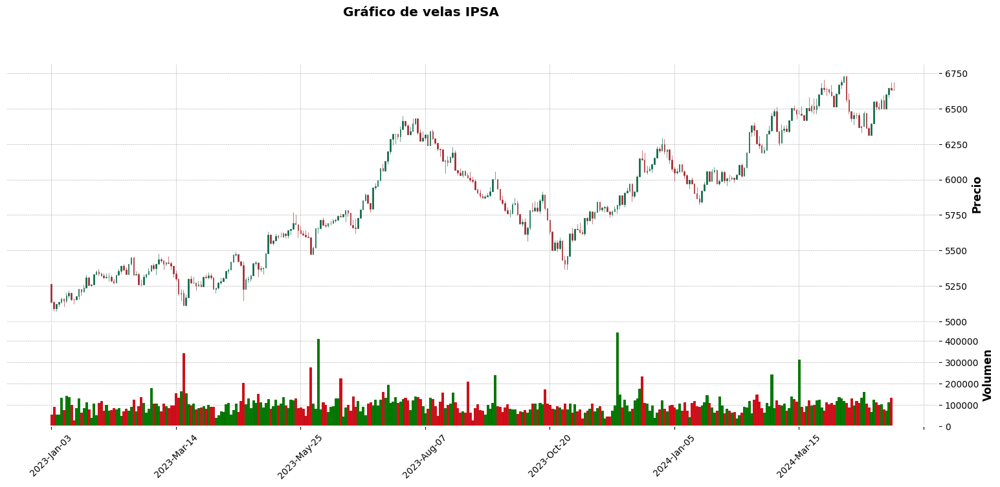

In [ ]:
# Filtrar por rango de años
start_year = 2023
end_year = 2025
filtro_df_ipsa_año = df_ipsa.loc[(df_ipsa.index.year >= start_year) & (df_ipsa.index.year <= end_year)]

# Crear el gráfico de velas
fig, axes = mpf.plot(filtro_df_ipsa_año, type='candle', volume=True, style='charles', title='Gráfico de velas IPSA', figsize=(20,8), returnfig=True)

# Cambiar el nombre del eje y de los precios (eje principal)
axes[0].set_ylabel('Precio')

# Cambiar el nombre del eje y del volumen (eje de volumen)
axes[2].set_ylabel('Volumen')

# Mostrar el gráfico con los nombres de los ejes actualizados
plt.show()


#Transformación para msa 10

In [ ]:
df_aguas_a_msa_10 = df_aguas_a['msa_aguas_a'] #1
df_andina_b_msa_10 = df_andina['msa_andina_b'] #2
df_bci_msa_10 = df_bci['msa_bci'] #3
df_bsantander_msa_10 = df_bsantander['msa_bsantander'] #4
df_cap_msa_10 = df_cap['msa_cap'] #5
df_ccu_msa_10 = df_ccu['msa_ccu'] #6
df_cencoshopp_msa_10 = df_cencoshopp['msa_cencoshopp'] #7
df_cencosud_msa_10 = df_cencosud['msa_cencosud'] #8
df_bchile_msa_10 = df_bchile['msa_bchile'] #9
df_cmpc_msa_10 = df_cmpc['msa_cmpc'] #10
df_colbun_msa_10 = df_colbun['msa_colbun'] #11
df_concha_y_toro_msa_10 = df_concha_y_toro['msa_concha_y_toro'] #12
df_copec_msa_10 = df_copec['msa_copec'] #13
df_ecl_msa_10 = df_ecl['msa_ecl'] #14
df_enelam_msa_10 = df_enelam['msa_enelam'] #15
df_enel_chile_msa_10 = df_enel_chile['msa_enel_chile'] #16
df_entel_msa_10 = df_entel['msa_entel'] #17
df_falabella_msa_10 = df_falabella['msa_falabella'] #18
df_iam_msa_10 = df_iam['msa_iam'] #19
df_itau_msa_10 = df_itau['msa_itau'] #20
df_ltm_msa_10 = df_ltm['msa_ltm'] #21
df_mallplaza_msa_10 = df_mallplaza['msa_mallplaza'] #22
df_oro_blanco_msa_10 = df_oro_blanco['msa_oro_blanco'] #23
df_parauco_msa_10 = df_parauco['msa_parauco'] #24
df_quinenco_msa_10 = df_quinenco['msa_quinenco'] #25
df_ripley_msa_10 = df_ripley['msa_ripley'] #26
df_salfacorp_msa_10 = df_salfacorp['msa_salfacorp'] #27
df_smu_msa_10 = df_smu['msa_smu'] #28
df_sqm_b_msa_10 = df_sqm_b['msa_sqm_b'] #29
df_vapores_msa_10 = df_vapores['msa_vapores'] #30



#Unir todos los valores de msa 10 en un solo Data Frame (IPSA)

In [ ]:
df_concat = [df_aguas_a_msa_10, df_andina_b_msa_10, df_bci_msa_10, df_bsantander_msa_10, df_cap_msa_10, df_ccu_msa_10, df_cencoshopp_msa_10, df_cencosud_msa_10, df_bchile_msa_10, df_cmpc_msa_10, df_colbun_msa_10, df_concha_y_toro_msa_10, df_copec_msa_10, df_ecl_msa_10, df_enelam_msa_10, df_enel_chile_msa_10, df_entel_msa_10, df_falabella_msa_10, df_iam_msa_10, df_itau_msa_10, df_ltm_msa_10, df_mallplaza_msa_10, df_oro_blanco_msa_10, df_parauco_msa_10, df_quinenco_msa_10, df_ripley_msa_10, df_salfacorp_msa_10, df_smu_msa_10, df_sqm_b_msa_10, df_vapores_msa_10]


df_msa_10 = pd.concat(df_concat, axis=1, join='outer')
df_msa_10 = df_msa_10.fillna(0) #Rellena con 0 los valores faltantes
df_msa_10['promedio_msa_10'] = df_msa_10.sum(axis = 1)/30
df_msa_10.tail(10)

,msa_aguas_a,msa_andina_b,msa_bci,msa_bsantander,msa_cap,msa_ccu,msa_cencoshopp,msa_cencosud,msa_bchile,msa_cmpc,...,msa_mallplaza,msa_oro_blanco,msa_parauco,msa_quinenco,msa_ripley,msa_salfacorp,msa_smu,msa_sqm_b,msa_vapores,promedio_msa_10
Date,,,,,,,,,,,,,,,,,,,,,
2024-05-06,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.066667
2024-05-07,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.066667
2024-05-08,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.066667
2024-05-09,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.066667
2024-05-10,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.066667
2014-05-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-05-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-05-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-05-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


#Gráfico msa10

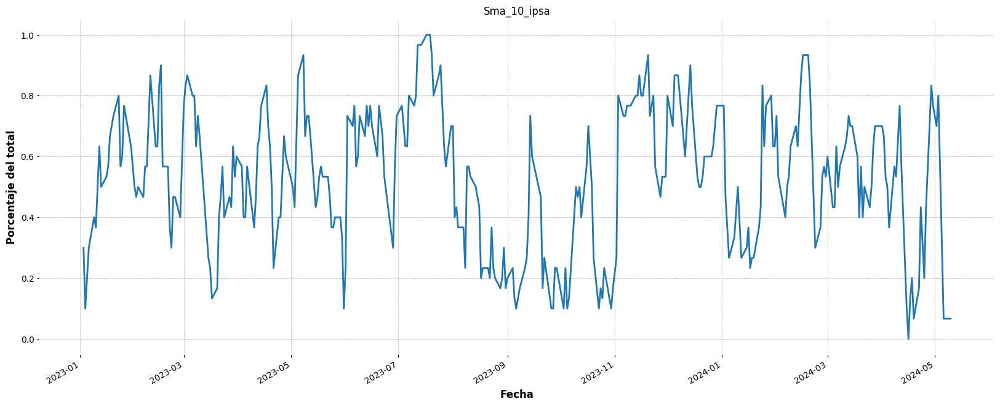

In [ ]:
df_msa_10.index = pd.to_datetime(df_msa_10.index)

start_year = 2023
end_year = 2024
filtro_df_msa_año = df_msa_10.loc[(df_msa_10.index.year >= start_year) & (df_msa_10.index.year <= end_year)]
filtro_df_msa_año['promedio_msa_10'].plot(figsize = (20,8))
plt.xlabel('Fecha')
plt.title('Sma_10_ipsa')
plt.ylabel('Porcentaje del total')
plt.show()
